In [1]:
import matplotlib
import sys
import os

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.font_manager as fm
import gseapy as gp

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from cmapPy.pandasGEXpress.parse import parse
from scipy import stats
from pandas import DataFrame as df
from matplotlib import pyplot as plt
from matplotlib.ft2font import FT2Font
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

def get_font(*args, **kwargs):
    return FT2Font(*args, **kwargs)

fm.get_font = get_font

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

# Global path

In [2]:
# home path
data_home = 'D:/TuanTuan/Projects/POSEIDON/data/'

In [3]:
gsea_home = 'D:/TuanTuan/Projects/POSEIDON/GSEA/'

# Synergy Core Implementation

In [4]:
def reverse_score(sigR, sigD):
    '''
    Calculate the reverse score: the ability of a drug to reverse the resistance genes
    Input:
        sigR: pandas dataframe, resistance signature with values from [-1, 1], index are genes
        sigD: pandas dataframe, drug treatment signature with values from [-1, 1], index are genes
    Return:
        rev_score_ave: float, the reverse score indicating the percentage of genes that can be reversed by the drug
                   versus arithmetic mean of signature length.
        rev_score_geo: float, the reverse score indicating the percentage of genes that can be reversed by the drug
                   versus geometric mean of signature length.
    '''
    # length of the drug signature
    tmp_d = sigD[sigD != 0].dropna(axis=0, how='any').shape[0]
    
    #  length of the resistance signature
    tmp_r = sigR[sigR != 0].dropna(axis=0, how='any').shape[0]

    # calculate the number of genes that show reverse pattern in two signatures 
    tmp_rd = pd.concat([sigR, sigD], axis=1).fillna(0)
    tmp_rev = tmp_rd[tmp_rd.columns[0]] * tmp_rd[tmp_rd.columns[1]]
    l_rev = sum([1. for i in tmp_rev if i < 0])
    
    # calculate the reverse scores
    rev_score_ave = l_rev / ((tmp_d + tmp_r) / 2)
    rev_score_geo = l_rev / ((tmp_d * tmp_r) ** .5)

    return rev_score_ave, rev_score_geo


def promote_score(sigR, sigD):
    '''
    Calculate the promote score: the ability of a drug to promote the resistance genes
    Input:
        sigR: pandas dataframe, resistance signature with values from [-1, 1], index are genes
        sigD: pandas dataframe, drug treatment signature with values from [-1, 1], index are genes
    Return:
        pro_score_ave: float, the promote score indicating the percentage of genes that can be promoted by the drug
                   versus arithmetic mean of signature length.
        pro_score_geo: float, the promote score indicating the percentage of genes that can be promoted by the drug
                   versus geometric mean of signature length.
    '''
    # length of the drug signature
    tmp_d = sigD[sigD != 0].dropna(axis=0, how='any').shape[0]
    
    #  length of the resistance signature
    tmp_r = sigR[sigR != 0].dropna(axis=0, how='any').shape[0]

    # calculate the number of genes that show reverse pattern in two signatures 
    tmp_rd = pd.concat([sigR, sigD], axis=1).fillna(0)
    tmp_pro = tmp_rd[tmp_rd.columns[0]] * tmp_rd[tmp_rd.columns[1]]
    l_pro = sum([1. for i in tmp_pro if i > 0])
    
    # calculate the reverse scores
    pro_score_ave = l_pro / ((tmp_d + tmp_r) / 2)
    pro_score_geo = l_pro / ((tmp_d * tmp_r) ** .5)

    return pro_score_ave, pro_score_geo
    

def orthogonal_score(sigT, sigD):
    '''
    Calculate the orthogonal score: the ability of a drug to be independent from the mechanism of reference treatment
    The lower orthogonal score would be better
    According to the calculation, this score can also be used as concordance score if being used in an opposite direction
    Input:
        sigT: pandas dataframe, treatment signature with values from [-1, 1], index are genes
        sigD: pandas dataframe, drug treatment signature with values from [-1, 1], index are genes
    Return:
        orth_score_ave: float, the orthogonal score indicating the orthogonality of the drug to the
                           reference treatment versus arithmetic mean of signature length.
        orth_score_geo: float, the orthogonal score indicating the orthogonality of the drug to the
                          reference treatment versus geometric mean of signature length.
    '''
    # length of the drug signature
    tmp_d = sigD[sigD != 0].dropna(axis=0, how='any').shape[0]
    
    #  length of the therapy signature
    tmp_t = sigT[sigT != 0].dropna(axis=0, how='any').shape[0]
    
    # calculate the orthogonal genes: exclude reverse and consistent
    l_orth = sum([1. for i in sigT.index if i in sigD.index])
    
    # global orthogonal score is given by number of orthogonal genes versus total union genes
    orth_score_ave = 1 - l_orth / ((tmp_d + tmp_t) / 2)
    
    # local orthogonal score is given by number of orthogonal genes in ICB treatment versus all the ICB genes
    orth_score_geo = 1 - l_orth / ((tmp_d * tmp_t) ** .5)
    
    return orth_score_ave, orth_score_geo



def complementary_score(sigT, sigD, sigR):
    '''
    Calculate the complementary score: the ability of a drug to reverse the genes independently from reference treatment 
    Input:
        sigT: pandas dataframe, ICB treatment signature with values from [-1, 1], index are genes
        sigD: pandas dataframe, drug treatment signature with values from [-1, 1], index are genes
        sigR: pandas dataframe, resistance signature with values from [-1, 1], index are genes
    Return:
        comp_score: float, the complemenetary score indicating the drug can reverse as many as genes that the reference treatment fail to do so.
    '''
    # remove zeros in resistance signature
    tmp_r = sigR[sigR != 0].dropna(axis=0, how='any')
    l_r = tmp_r.shape[0]

    # calculate the number of genes that show reverse pattern in drug signature and resistance signature
    tmp_rd = pd.concat([sigR, sigD], axis=1).fillna(0)
    tmp_rev = df(tmp_rd[tmp_rd.columns[0]] * tmp_rd[tmp_rd.columns[1]])
     
    # count the genes that are 0 (non-significant) in T but -1 (reverse) in R&D
    tmp_comp = tmp_rev[tmp_rev[0] == -1]
    tmp_comp = sum([1. for i in tmp_comp.index if i not in sigT.index])
    
    # complementary_score is given by number of independent drug-changed genes versus all genes in resistance signature
    comp_score = tmp_comp / float(l_r)
    
    return comp_score


def generalized_synergy(sigD1, sigD2, sigR):
    '''
    Calculate the generalized synergy measurement that compare any two drugs
    '''
    # length of the drug1 signature
    tmp_d1 = sigD1[sigD1 != 0].dropna(axis=0, how='any').shape[0]
    
    #  length of the drug2 signature
    tmp_d2 = sigD2[sigD2 != 0].dropna(axis=0, how='any').shape[0]
    
    #  length of the resistance signature
    tmp_r = sigR[sigR != 0].dropna(axis=0, how='any').shape[0]
    
    # ------- calculate the reverse term and promote term ------- #
    tmp_rd1 = pd.concat([sigR, sigD1], axis=1).fillna(0)
    tmp_cross1 = tmp_rd1[tmp_rd1.columns[0]] * tmp_rd1[tmp_rd1.columns[1]]
    l_rev1 = sum([1. for i in tmp_cross1 if i < 0])
    l_pro1 = sum([1. for i in tmp_cross1 if i > 0])

    tmp_rd2 = pd.concat([sigR, sigD2], axis=1).fillna(0)
    tmp_cross2 = tmp_rd2[tmp_rd2.columns[0]] * tmp_rd2[tmp_rd2.columns[1]]

    l_rev2 = sum([1. for i in tmp_cross2 if i < 0])
    l_pro2 = sum([1. for i in tmp_cross2 if i > 0])
    
    rev_term = l_rev1 / (tmp_d1 * tmp_r) ** .5 + l_rev2 / (tmp_d2 * tmp_r) ** .5
    pro_term = l_pro1 / (tmp_d1 * tmp_r) ** .5 + l_pro2 / (tmp_d2 * tmp_r) ** .5
    
    # ------- calculate the direction term ------- #
    direct_d1d2 = rev_term - pro_term # less than 0 means promotion, more than 1 means reverse
    direct_d1 = l_rev1 / (tmp_d1 * tmp_r) ** .5 - l_pro1 / (tmp_d1 * tmp_r) ** .5
    direct_d2 = l_rev2 / (tmp_d2 * tmp_r) ** .5 - l_pro2 / (tmp_d2 * tmp_r) ** .5
    
    # ------- calculate the orthogonal term ------- #
    # the rationale of orthogonal term is that target disease genes are orthogonal between two drugs
    tmp_d1d2 = pd.concat([sigD1, sigD2], axis=1).fillna(0)
    tmp_cross12 = df(tmp_d1d2[tmp_d1d2.columns[0]] * tmp_d1d2[tmp_d1d2.columns[1]])
    tmp_cross12_diff = tmp_cross12[tmp_cross12[0] == -1].index
    tmp_cross12_all = tmp_cross12[tmp_cross12[0] != 0].index
    l_cross12_diff = sum([1. for i in tmp_cross12_diff if i in sigR.index])
    l_cross12_all = sum([1. for i in tmp_cross12_all if i in sigR.index])
    orth_term = 1 - l_cross12_diff / l_cross12_all
    orth_term_r = 1 - l_cross12_all / tmp_r
    
    return rev_term, pro_term, direct_d1d2, direct_d1, direct_d2, orth_term, orth_term_r

# Visualization

## Top-Heat

In [5]:
## Heatmap for top hits ##
def topheat(measurement, compound_info, synergy_result, resistance_signature, response_signature, drug_signature, method='sort', save_path=None):
    '''
    Visualize the top 10 hits by signature genes.
    Input:
        cell_cluster: str, name of the cell populations focused
        synergy_result: dataframe, top results of synergy evaluation
        *_signature: dataframe, dichotomized signature matrix
        method: str, ['cluster', 'sort'], defualt 'sort'
    Return:
        
    '''
    top_hit = synergy_result.sort_values(by=measurement, ascending=False)[:10]
    top_drug_signature = drug_signature[top_hit.index]
    
    # construct merged matrix
    tmp_merged = resistance_signature.rename(columns={resistance_signature.columns[0]: 'ICB Resistance Signature'})
    tmp_merged['ICB Treatment Signature'] = response_signature[response_signature.columns[0]]
    # remove both zero genes
    tmp_merged = tmp_merged[tmp_merged != 0].dropna(axis=0, how='all').fillna(0)


    # concat the drug signatures
    tmp_merged_drug = pd.concat([tmp_merged, top_drug_signature], axis=1).dropna(axis=0, how='all').fillna(0)
    
    if method == 'sort':
    
        # sorting
        tmp_p = tmp_merged_drug[tmp_merged_drug['ICB Resistance Signature'] == 1.]
        tmp_n = tmp_merged_drug[tmp_merged_drug['ICB Resistance Signature'] == -1.]

        tmp_p_sorted = []
        to_sort = tmp_p.index
        for d in tmp_p.columns:
            if d == 'ICB Resistance Signature':
                continue
            tmp_d = df(tmp_p.loc[to_sort, d]).sort_values(by=d, ascending=False)
            tmp_d_s = tmp_d[tmp_d[d] != 0].dropna(axis=0, how='any').index
            tmp_p_sorted.extend(tmp_d_s)
            to_sort = tmp_d[tmp_d[d] == 0].dropna(axis=0, how='any').index

        tmp_n_sorted = []
        to_sort = tmp_n.index
        for d in tmp_n.columns:
            if d == 'ICB Resistance Signature':
                continue
            tmp_d = df(tmp_n.loc[to_sort, d]).sort_values(by=d, ascending=False)
            tmp_d_s = tmp_d[tmp_d[d] != 0].dropna(axis=0, how='any').index
            tmp_n_sorted.extend(tmp_d_s)
            to_sort = tmp_d[tmp_d[d] == 0].dropna(axis=0, how='any').index

        sorted_merged = tmp_p_sorted
        sorted_merged.extend(tmp_n_sorted)
        final_sorted_sig = df(tmp_merged_drug.loc[sorted_merged, :]).T

        # visualize
        plt.figure(figsize=(20, 4))
        sns.heatmap(final_sorted_sig.rename(index=compound_info['cmap_name']), cmap='bwr', linewidths=0.005, linecolor='gray')
        plt.tight_layout()
    
    elif method == 'cluster':
        sns.clustermap(
            tmp_merged_drug.T.rename(index=compound_info['cmap_name']),
            figsize=(20, 4), row_cluster=False, col_cluster=True, cmap='bwr',
            method='ward')
        plt.tight_layout()

    if save_path is not None:
        fig = plt.gcf()
        fig.savefig(save_path, dpi=300, transparent=True)
    
    return


## Heatmap for selected hits ##
def selectheat(number_hit, measurement, compound_info, synergy_result, resistance_signature, response_signature, drug_signature):
    '''
    Visualize the top 10 hits by signature genes.
    Input:
        cell_cluster: str, name of the cell populations focused
        synergy_result: dataframe, top results of synergy evaluation
        *_signature: dataframe, dichotomized signature matrix
        method: str, ['cluster', 'sort'], defualt 'sort'
    Return:
        
    '''
    top_hit = synergy_result.sort_values(by=measurement, ascending=False)[:number_hit]
    top_drug_signature = drug_signature[top_hit.index]
    
    # construct merged matrix
    tmp_merged = resistance_signature.rename(columns={resistance_signature.columns[0]: 'ICB Resistance Signature'})
    tmp_merged['ICB Treatment Signature'] = response_signature[response_signature.columns[0]]
    # remove both zero genes
    tmp_merged = tmp_merged[tmp_merged != 0].dropna(axis=0, how='all').fillna(0)

    for d in top_drug_signature.columns:
        tmp_drug_signature = top_drug_signature[d]
        # concat the drug signatures
        tmp_merged_drug = pd.concat([tmp_merged, tmp_drug_signature], axis=1).dropna(axis=0, how='all').fillna(0)

        # sorting
        tmp_p = tmp_merged_drug[tmp_merged_drug['ICB Resistance Signature'] == 1.]
        tmp_n = tmp_merged_drug[tmp_merged_drug['ICB Resistance Signature'] == -1.]

        tmp_p_sorted = []
        to_sort = tmp_p.index
        for d in tmp_p.columns:
            if d == 'ICB Resistance Signature':
                continue
            tmp_d = df(tmp_p.loc[to_sort, d]).sort_values(by=d, ascending=False)
            tmp_d_s = tmp_d[tmp_d[d] != 0].dropna(axis=0, how='any').index
            tmp_p_sorted.extend(tmp_d_s)
            to_sort = tmp_d[tmp_d[d] == 0].dropna(axis=0, how='any').index

        tmp_n_sorted = []
        to_sort = tmp_n.index
        for d in tmp_n.columns:
            if d == 'ICB Resistance Signature':
                continue
            tmp_d = df(tmp_n.loc[to_sort, d]).sort_values(by=d, ascending=False)
            tmp_d_s = tmp_d[tmp_d[d] != 0].dropna(axis=0, how='any').index
            tmp_n_sorted.extend(tmp_d_s)
            to_sort = tmp_d[tmp_d[d] == 0].dropna(axis=0, how='any').index

        sorted_merged = tmp_p_sorted
        sorted_merged.extend(tmp_n_sorted)
        final_sorted_sig = df(tmp_merged_drug.loc[sorted_merged, :]).T

        # visualize
        plt.figure(figsize=(10, 2))
        sns.heatmap(final_sorted_sig.rename(index=compound_info['cmap_name']), linewidths=0.01, cmap='bwr')
        plt.tight_layout()
    
    return

## Ring Plots

In [6]:
def ringplot_initiate(sigR, sigT, sigD):
    '''
    Visualize the selected hits by signature genes.
    Input:
        *_signature: dataframe, dichotomized signature matrix
        method: str, ['cluster', 'sort'], defualt 'sort'
    Return:
        
    '''
    # construct merged matrix
    sigR = sigR.rename(columns={sigR.columns[0]: 'ICB Resistance'})
    sigT = sigT.rename(columns={sigT.columns[0]: 'ICB Treatment'})

    # concat the drug signatures
    tmp_merged_drug = pd.concat([sigR, sigT, sigD], axis=1).dropna(axis=0, how='all').fillna(0)
    tmp_merged_drug = tmp_merged_drug[tmp_merged_drug['ICB Resistance'] != 0]
    tmp_merged_drug = tmp_merged_drug[(tmp_merged_drug['ICB Treatment'] != 0) | (tmp_merged_drug[sigD.columns[0]] != 0)]

    # create rings: resistance signature
    outter_ring = [tmp_merged_drug[tmp_merged_drug['ICB Resistance'] == 1.].shape[0],
                   tmp_merged_drug[tmp_merged_drug['ICB Resistance'] == -1.].shape[0]]
    outter_color = ['crimson', 'cornflowerblue']
    
    def create_ring(label, tmp_merge):
        tmp_pos = tmp_merge[tmp_merge[label] == 1.]
        tmp_neg = tmp_merge[tmp_merge[label] == -1.]
        tmp_zero = tmp_merge[tmp_merge[label] == 0]
        
        return tmp_pos, tmp_neg, tmp_zero
    
    # middle_ring: therapy signature
    # resis_pos
    tmp_m_pos = tmp_merged_drug[tmp_merged_drug['ICB Resistance'] == 1.]
    tmp_m_pos_pos, tmp_m_pos_neg, tmp_m_pos_zero = create_ring(label='ICB Treatment', tmp_merge=tmp_m_pos)
    # resis_neg
    tmp_m_neg = tmp_merged_drug[tmp_merged_drug['ICB Resistance'] == -1.]
    tmp_m_neg_pos, tmp_m_neg_neg, tmp_m_neg_zero = create_ring(label='ICB Treatment', tmp_merge=tmp_m_neg) 
    middle_ring = [tmp_m_pos_pos.shape[0],
                   tmp_m_pos_neg.shape[0],
                   tmp_m_pos_zero.shape[0],
                   tmp_m_neg_pos.shape[0],
                   tmp_m_neg_neg.shape[0],
                   tmp_m_neg_zero.shape[0]]
    middle_color = ['crimson', 'cornflowerblue', 'white', 'crimson', 'cornflowerblue', 'white']
    
    # inner_ring: drug signature
    # pos+pos
    tmp_m_pos_pos_pos, tmp_m_pos_pos_neg, tmp_m_pos_pos_zero = create_ring(label=sigD.columns[0],
                                                                           tmp_merge=tmp_m_pos_pos)
    # pos+neg
    tmp_m_pos_neg_pos, tmp_m_pos_neg_neg, tmp_m_pos_neg_zero = create_ring(label=sigD.columns[0],
                                                                           tmp_merge=tmp_m_pos_neg)
    # pos+zero
    tmp_m_pos_zero_pos, tmp_m_pos_zero_neg, tmp_m_pos_zero_zero = create_ring(label=sigD.columns[0],
                                                                           tmp_merge=tmp_m_pos_zero)
    # neg+pos
    tmp_m_neg_pos_pos, tmp_m_neg_pos_neg, tmp_m_neg_pos_zero = create_ring(label=sigD.columns[0],
                                                                           tmp_merge=tmp_m_neg_pos)
    # neg+neg
    tmp_m_neg_neg_pos, tmp_m_neg_neg_neg, tmp_m_neg_neg_zero = create_ring(label=sigD.columns[0],
                                                                           tmp_merge=tmp_m_neg_neg)
    # neg+zero
    tmp_m_neg_zero_pos, tmp_m_neg_zero_neg, tmp_m_neg_zero_zero = create_ring(label=sigD.columns[0],
                                                                           tmp_merge=tmp_m_neg_zero)
    
    inner_ring = [tmp_m_pos_pos_pos.shape[0], tmp_m_pos_pos_neg.shape[0], tmp_m_pos_pos_zero.shape[0],
                  tmp_m_pos_neg_pos.shape[0], tmp_m_pos_neg_neg.shape[0], tmp_m_pos_neg_zero.shape[0],
                  tmp_m_pos_zero_pos.shape[0], tmp_m_pos_zero_neg.shape[0], tmp_m_pos_zero_zero.shape[0],
                  tmp_m_neg_pos_pos.shape[0], tmp_m_neg_pos_neg.shape[0], tmp_m_neg_pos_zero.shape[0],
                  tmp_m_neg_neg_pos.shape[0], tmp_m_neg_neg_neg.shape[0], tmp_m_neg_neg_zero.shape[0],
                  tmp_m_neg_zero_pos.shape[0], tmp_m_neg_zero_neg.shape[0], tmp_m_neg_zero_zero.shape[0]]
    inner_color = ['salmon', 'paleturquoise', 'white',
                   'salmon', 'paleturquoise', 'white',
                   'salmon', 'paleturquoise', 'white',
                   'salmon', 'paleturquoise', 'white',
                   'salmon', 'paleturquoise', 'white',
                   'salmon', 'paleturquoise', 'white']
    
    # pack the return
    p_return = {'outter': {'ring': outter_ring, 'color': outter_color},
                'middle': {'ring': middle_ring, 'color': middle_color},
                'inner': {'ring': inner_ring, 'color': inner_color}}
    return p_return

def ringplot(ringplot_init, drug_name, r_length, ax, ring_size, ring_width, ft_size):
    '''
    Visualize the rings by input
    Input:
        ringplot_init: dictionary object returned from ringplot_initiation(...)
        drug_name: str, name of the drugs
        r_length: length of the whole resistance signature
        ax: current axes
    Return:
        ax plots
    '''
    # assign size and color of the rings
    size_outter = ringplot_init['outter']['ring']
    color_outter = ringplot_init['outter']['color']
    size_middle = ringplot_init['middle']['ring']
    color_middle = ringplot_init['middle']['color']
    size_inner = ringplot_init['inner']['ring']
    color_inner = ringplot_init['inner']['color']
    
    # set the scale
    scale = (sum(size_outter) / r_length) ** .5
    
    # draw the plot
    tmp_patches = ax.pie(size_outter,
                         radius=ring_size * scale,
                         startangle=180,
                         wedgeprops={'edgecolor': 'k'},
                         colors=color_outter)
    for i in range(len(tmp_patches[0])):
        tmp_patches[0][i].set(hatch='///', fill=True)
    ax.pie(size_middle,
           radius=(ring_size - ring_width) * scale,
           startangle=180,
           wedgeprops={'edgecolor': 'k'},
           colors=color_middle)
    ax.pie(size_inner,
           radius=(ring_size - ring_width * 2) * scale,
           startangle=180,
           wedgeprops={'edgecolor': 'k'},
           colors=color_inner)
    
    # add the text
    center_circle=plt.Circle((0,0),
                             (ring_size - ring_width * 3) * scale,
                             edgecolor='black',
                             facecolor='white')
    ax.add_patch(center_circle)
    ax.annotate(drug_name, xy=(0, 0), fontsize=ft_size * scale, ha='center', color='black')
    ax.axis('off')
    ax.set_aspect('equal')
    return


def ring_matrix_plot(measurement,
                     compound_info,
                     synergy_result,
                     resistance_signature,
                     response_signature,
                     drug_signature,
                     plot_kwargs,
                     save_path=None):
    '''
    Plot a matrix of rings, showing the top 10 results
    Input:
        synergy_result: dataframe, top results of synergy evaluation
        *_signature: dataframe, dichotomized signature matrix
        plot_kwargs: dict, parameters for ring plots {'ft_size', 'ring_size', 'ring_width', ...}
    '''
    # set the plots and turn off the axis
    fig, ax = plt.subplots(figsize=(20, 8))
    ax.set_axis_off()
    
    # choose the top hits by given measurement
    top_hit = synergy_result.sort_values(by=measurement, ascending=False)[:10].index
    
    # traverse the top hits
    for i in range(len(top_hit)):
        # add the plot
        tmp_ax = fig.add_subplot(2, 5, i + 1)
        
        # create the signature
        tmp_pert = df(drug_signature[top_hit[i]]).groupby(level=0).mean()
        tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
        
        # draw the rings
        ringplot(ringplot_init=ringplot_initiate(sigD=tmp_pert, sigT=response_signature, sigR=resistance_signature),
                 drug_name=compound_info.loc[top_hit[i], 'cmap_name'],
                 r_length=resistance_signature.shape[0],
                 ring_size=plot_kwargs['ring_size'],
                 ring_width=plot_kwargs['ring_width'],
                 ft_size=plot_kwargs['ft_size'],
                 ax=tmp_ax)
    
    plt.tight_layout(pad=0)
    
    if save_path is not None:
        fig_merged = plt.gcf()
        fig_merged.savefig(save_path, dpi=300, transparent=True)

    return

# L1000 signature preparation

In [10]:
# Read the established signatures for BRCA cell lines and SKCM cell lines: cutoff using abs(z_score) >= 1.
brca_trt_cp = pd.read_csv(data_home + 'CMAP2020_Cancer/BRCA/trt_cp_sigcut_1.csv',
                          header=0, index_col=0, sep='\t')
brca_trt_sh = pd.read_csv(data_home + 'CMAP2020_Cancer/BRCA/trt_sh_sigcut_1.csv',
                          header=0, index_col=0, sep='\t')
skcm_trt_cp = pd.read_csv(data_home + 'CMAP2020_Cancer/SKCM/trt_cp_sigcut_1.csv',
                          header=0, index_col=0, sep='\t')
skcm_trt_sh = pd.read_csv(data_home + 'CMAP2020_Cancer/SKCM/trt_sh_sigcut_1.csv',
                          header=0, index_col=0, sep='\t')

In [11]:
# Read signature info
brca_sig_info = pd.read_csv(data_home + 'CMAP2020_Cancer/BRCA/brca_2020_tash_sig_info.csv',
                            header=0, index_col=0, sep=',')
skcm_sig_info = pd.read_csv(data_home + 'CMAP2020_Cancer/SKCM/skcm_2020_tash_sig_info.csv',
                            header=0, index_col=0, sep=',')

In [12]:
# show the dimensions
print(brca_trt_cp.shape, brca_trt_sh.shape, brca_sig_info.shape)
print(skcm_trt_cp.shape, skcm_trt_sh.shape, skcm_sig_info.shape)

(10174, 9573) (10174, 2060) (12119, 36)
(10174, 4917) (10174, 2384) (8032, 36)


In [10]:
jurkat_lv5_sig = pd.read_csv(data_home + 'CMAP2020_Cancer/JURKAT/jurkat_lv5_sig_tas_h_CMAP2020.csv', header=0, index_col=0, sep=',')

In [11]:
jurkat_lv5_sig_info = pd.read_csv(
     data_home + 'CMAP2020_Cancer/siginfo_beta.txt',
     index_col='sig_id', header=0, sep='\t')
jurkat_lv5_sig_info = jurkat_lv5_sig_info[jurkat_lv5_sig_info['cell_mfc_name'] == 'JURKAT']
jurkat_lv5_sig_info = jurkat_lv5_sig_info[jurkat_lv5_sig_info['pert_type'] == 'trt_cp']

C:\Users\ywang\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3457: DtypeWarning: Columns (0,3,4,28,29) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [5]:
# L1000 gene info
bing_landmark = pd.read_csv(data_home + 'CMAP2020_Cancer/landmark_and_bings_L1000.csv',
                            header=0, index_col=0, sep=',', dtype={'Official NCBI gene symbol': 'str'}, converters={'Official NCBI gene symbol': None})
bing_landmark

,Official NCBI gene symbol
Official NCBI gene id,
5720,PSME1
7416,VDAC1
55847,CISD1
10174,SORBS3
25803,SPDEF
...,...
5137,PDE1C
51233,DRICH1
4340,MOG


In [13]:
bing_landmark.sort_values(by='Official NCBI gene symbol', ascending=True)[:20]

,Official NCBI gene symbol
Official NCBI gene id,
2,A2M
53947,A4GALT
8086,AAAS
65985,AACS
13,AADAC
79719,AAGAB
22848,AAK1
28971,AAMDC
14,AAMP


# ICB signature preparation

In [14]:
def construct_response_signature(l_post, l_pre):
    '''
    Construct response signature based on differentially expressed genes.
    l_post, l_pre: dataframe, expression matrix in selected gene space
    '''
    # DEGs in landmark space
    ranksum_landmark = df(columns=['log2FC(P-N)', 'ranksum_stat', 'ranksum_p'])
    for g in l_post.index:
        tmp_post = l_post.loc[g, :]
        tmp_pre = l_pre.loc[g, :]
        ranksum_landmark.at[g, 'log2FC(P-N)'] = tmp_post.mean() - tmp_pre.mean()
        ranksum_landmark.at[g, 'ranksum_stat'], ranksum_landmark.at[g, 'ranksum_p'] = stats.ranksums(tmp_post, tmp_pre)
    
    # deg: ranksum p < 0.05, |log2fc| > 1
    deg_landmark = ranksum_landmark[abs(ranksum_landmark['log2FC(P-N)']) >= 1]
    # deg_landmark = deg_landmark[deg_landmark['ranksum_p'] <= 0.1]
    
    # establish the disease signature
    disease_sig = df(index=deg_landmark.index, columns=['quant', 'dicho'])
    disease_sig['quant'] = deg_landmark['log2FC(P-N)']
    disease_sig['dicho'] = np.sign(deg_landmark['log2FC(P-N)'])

    return disease_sig

def construct_response_signature_paired(l_post, l_pre):
    '''
    Construct response signature based on differentially expressed genes.
    l_post, l_pre: dataframe, expression matrix in selected gene space
    '''
    # DEGs in landmark space
    ranksum_landmark = df(columns=['log2FC(P-N)', 'ranksum_stat', 'ranksum_p'])
    for g in l_post.index:
        tmp_post = l_post.loc[g, :]
        tmp_pre = l_pre.loc[g, :]
        ranksum_landmark.at[g, 'log2FC(P-N)'] = tmp_post.mean() - tmp_pre.mean()
        ranksum_landmark.at[g, 'ranksum_stat'], ranksum_landmark.at[g, 'ranksum_p'] = stats.wilcoxon(tmp_post, tmp_pre, zero_method='zsplit')

    return ranksum_landmark

def nebularplot(sig1, sig2, save_path=None, drop_zero='off'):
    '''
    A plot that visualize the consistency between two signatures.
    Name comes from the nebulars.
    Attributes:
        sig1, sig2: pandas seriese, vector of discrete signature
        drop_zero: 'off', 'both', 'any', whether to remove the genes that 
                    are not significant in either cases or both cases, default 'off'
        save_path: path to save the figure, if None, don't save the figure, default None
    Return:
        consistency_result: dataframe, a contingency table showing the consistency
    '''
    # generate the contingency table
    consistency_result = pd.crosstab(sig1, sig2).T
    print(consistency_result)
    
    if drop_zero == 'off':
        # plot the density
        plt.figure(figsize=(5, 5))
        sns.kdeplot(
            x=sig1, y=sig2,
            fill=True, thresh=0, levels=100, cmap='mako')
    elif drop_zero == 'any':
        tmp_concat = pd.concat([sig1, sig2], axis=1)
        tmp_concat = tmp_concat[tmp_concat != 0].dropna(axis=0, how='any').index    
        # plot the density
        plt.figure(figsize=(5, 5))
        sns.kdeplot(
            x=sig1.loc[tmp_concat], y=sig2.loc[tmp_concat],
            fill=True, thresh=0, levels=100, cmap='mako')
    elif drop_zero == 'both':
        tmp_concat = pd.concat([sig1, sig2], axis=1)
        tmp_concat = tmp_concat[tmp_concat != 0].dropna(axis=0, how='all').index
        
        # plot the density
        plt.figure(figsize=(5, 5))
        sns.kdeplot(
            x=sig1.loc[tmp_concat], y=sig2.loc[tmp_concat],
            fill=True, thresh=0, levels=100, cmap='mako')

    # specify the lines
    plt.axvline(x=0.0, ls=':', c='w')
    plt.axvline(x=1.0, ls=':', c='w')
    plt.axvline(x=-1.0, ls=':', c='w')
    plt.axhline(y=0.0, ls=':', c='w')
    plt.axhline(y=1.0, ls=':', c='w')
    plt.axhline(y=-1.0, ls=':', c='w')
    plt.xticks(rotation=0, fontsize=12)
    plt.yticks(rotation=90, fontsize=12)
    
    # specify the flares
    for i in consistency_result.columns:
        for j in consistency_result.index:
            # concordance
            if i * j == 1:
                plt.text(
                    x=i, y=j,
                    s=str(consistency_result.loc[j, i]),
                    color='black', fontsize=12,
                    bbox=dict(facecolor='white', edgecolor='red', alpha=0.8))
                
            # discordance
            elif i * j == -1:
                plt.text(
                    x=i, y=j,
                    s=str(consistency_result.loc[j, i]),
                    color='black', fontsize=12,
                    bbox=dict(facecolor='white', edgecolor='blue', alpha=0.8))
                
            # zero: discordance
            elif i * j == 0 and (i != 0  or j != 0 ):
                plt.text(
                    x=i, y=j,
                    s=str(consistency_result.loc[j, i]),
                    color='black', fontsize=12,
                    bbox=dict(facecolor='white', edgecolor='gold', alpha=0.8))
            
            # zero: concordance
            elif i * j == 0 and (i == 0  and j == 0 ):
                plt.text(
                    x=i, y=j,
                    s=str(consistency_result.loc[j, i]),
                    color='black', fontsize=12,
                    bbox=dict(facecolor='white', edgecolor='black', alpha=0.8))
    # save figures
    if save_path is not None:
        plt.tight_layout()
        fig = plt.gcf()
        fig.savefig(save_path, dpi=300, transparent=True)
    
    return consistency_result

## 1. GSE168204: ICB treated melanoma, this is a test run

In [18]:
# GSE168204 original expression
expr_168204 = pd.read_csv(data_home + 'GSE168204/GSE168204_MGH_counts_cleaned.csv',
                          index_col=0, header=0, sep=',')
# overlap with the L1000 space
expr_168204 = expr_168204[expr_168204.index.isin(brca_trt_cp.index)]

# read clinical information
info_168204 = pd.read_csv(data_home + 'GSE168204/GSE168204_patient_info.csv',
                          index_col=0, header=0, sep=',')
print(expr_168204.shape, info_168204.shape)

(10059, 27) (27, 2)


In [19]:
pd.crosstab(info_168204['time'], info_168204['response'])

response,NR,R
time,,
POST,13,4
PRE,5,5


In [20]:
log2exp2_168204 = np.log2(expr_168204 + 1)

In [23]:
response_signature = {}

tmp_NR_pre = info_168204[(info_168204['time'] == 'PRE') & (info_168204['response'] == 'NR')]
tmp_NR_post = info_168204[(info_168204['time'] == 'POST') & (info_168204['response'] == 'NR')]
response_signature['NR'] = construct_response_signature(l_post=log2exp2_168204[tmp_NR_post.index],
                                                        l_pre=log2exp2_168204[tmp_NR_pre.index])
tmp_R_pre = info_168204[(info_168204['time'] == 'PRE') & (info_168204['response'] == 'R')]
tmp_R_post = info_168204[(info_168204['time'] == 'POST') & (info_168204['response'] == 'R')]
response_signature['R'] = construct_response_signature(l_post=log2exp2_168204[tmp_R_post.index],
                                                        l_pre=log2exp2_168204[tmp_R_pre.index])

In [24]:
response_signature['NR']['dicho'].value_counts()

 1    1091
-1     326
Name: dicho, dtype: int64

In [25]:
response_signature['R']['dicho'].value_counts()

-1    1328
 1    1222
Name: dicho, dtype: int64

In [26]:
sig_168294 = pd.concat([df(response_signature['R']['dicho']).rename(columns={'dicho': 'R'})['R'],
                        df(response_signature['NR']['dicho']).rename(columns={'dicho': 'NR'})['NR']],
                       axis=1).fillna(0)
sig_168294

,R,NR
A4GALT,-1,0
AADAC,1,1
AASDHPPT,1,0
AATK,-1,-1
ABCA8,1,0
...,...,...
ZNF551,0,1
ZNF593,0,1
ZNF84,0,1
ZSCAN12,0,1


NR   -1     0    1
R                 
-1   95  1162   71
 0  195     0  549
 1   36   715  471


NR,-1,0,1
R,,,
-1,95,1162,71
0,195,0,549
1,36,715,471


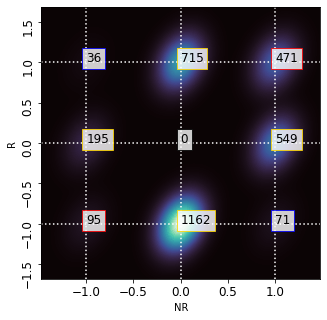

In [27]:
nebularplot(sig1=sig_168294['NR'],
            sig2=sig_168294['R'],
            save_path=None, drop_zero='off')

In [28]:
# exclude signature genes with same direction in R and NR
sig_168294_multi = df(sig_168294['NR'] * sig_168294['R'])
sig_168294_multi = sig_168294_multi[sig_168294_multi[0] == 1].index

sig_168294_selected = sig_168294[~sig_168294.index.isin(sig_168294_multi)]
print(sig_168294_selected)

          R  NR
A4GALT   -1   0
AASDHPPT  1   0
ABCA8     1   0
ABCB9    -1   0
ABCC2    -1   0
...      ..  ..
ZNF551    0   1
ZNF593    0   1
ZNF84     0   1
ZSCAN12   0   1
ZSCAN31   0   1

[2728 rows x 2 columns]


### 1.1 Run synergy evaluation

In [29]:
# output of the generalized synergy evaluation
se_168294_skcm_cp = df(index=skcm_trt_cp.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in skcm_trt_cp.columns:
    tmp_pert = df(skcm_trt_cp[pert]).groupby(level=0).mean()
    tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
    tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(sig_168294_selected['R']), sigR=df(sig_168294_selected['NR']))

    se_168294_skcm_cp.at[pert, 'reverse_term'] = tmp_result[0]
    se_168294_skcm_cp.at[pert, 'promoting_term'] = tmp_result[1]
    se_168294_skcm_cp.at[pert, 'direction_merged'] = tmp_result[2]
    se_168294_skcm_cp.at[pert, 'direction_d'] = tmp_result[3]
    se_168294_skcm_cp.at[pert, 'direction_t'] = tmp_result[4]
    se_168294_skcm_cp.at[pert, 'orth_term'] = tmp_result[5]
    se_168294_skcm_cp.at[pert, 'orth_term_r'] = tmp_result[6]

se_168294_skcm_cp = se_168294_skcm_cp.dropna(axis=0, how='any')

In [30]:
se_168294_skcm_cp

,reverse_term,promoting_term,direction_merged,direction_t,direction_d,orth_term,orth_term_r
ABY001_A375_XH:BRD-A61304759:10:24,0.149557,0.073371,0.076186,0.082347,-0.006161,0.484094,0.150411
ABY001_A375_XH:BRD-A61304759:2.5:24,0.144502,0.104484,0.040018,0.082347,-0.042329,0.516605,0.044653
ABY001_A375_XH:BRD-K19687926:10:24,0.164257,0.093106,0.071151,0.082347,-0.011196,0.475,0.20094
ABY001_A375_XH:BRD-K21680192:0.625:24,0.169144,0.11166,0.057483,0.082347,-0.024864,0.502698,-0.306698
ABY001_A375_XH:BRD-K21680192:0.625:3,0.158646,0.048947,0.1097,0.082347,0.027353,0.509569,0.508813
...,...,...,...,...,...,...,...
REP.B028_A375_24H:K20,0.158043,0.097252,0.060791,0.082347,-0.021556,0.450512,-0.032902
REP.B028_A375_24H:K21,0.157315,0.078655,0.07866,0.082347,-0.003687,0.426087,0.324324
REP.B028_A375_24H:L07,0.168726,0.104375,0.064351,0.082347,-0.017996,0.474785,0.044653
REP.B028_A375_24H:L08,0.156668,0.087632,0.069036,0.082347,-0.013311,0.522388,0.13396


In [31]:
# output of the generalized synergy evaluation
se_168294_skcm_sh = df(index=skcm_trt_sh.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in skcm_trt_sh.columns:
    tmp_pert = df(skcm_trt_sh[pert]).groupby(level=0).mean()
    tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
    tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(sig_168294_selected['R']), sigR=df(sig_168294_selected['NR']))

    se_168294_skcm_sh.at[pert, 'reverse_term'] = tmp_result[0]
    se_168294_skcm_sh.at[pert, 'promoting_term'] = tmp_result[1]
    se_168294_skcm_sh.at[pert, 'direction_merged'] = tmp_result[2]
    se_168294_skcm_sh.at[pert, 'direction_d'] = tmp_result[3]
    se_168294_skcm_sh.at[pert, 'direction_t'] = tmp_result[4]
    se_168294_skcm_sh.at[pert, 'orth_term'] = tmp_result[5]
    se_168294_skcm_sh.at[pert, 'orth_term_r'] = tmp_result[6]

se_168294_skcm_sh = se_168294_skcm_sh.dropna(axis=0, how='any')

In [32]:
se_168294_skcm_sh

,reverse_term,promoting_term,direction_merged,direction_t,direction_d,orth_term,orth_term_r
DER001_A375_96H:TRCN0000002228:-666,0.190287,0.077411,0.112876,0.082347,0.030528,0.486346,0.096357
DER001_A375_96H:TRCN0000017935:-666,0.139276,0.130506,0.00877,0.082347,-0.073578,0.546144,0.070505
DER001_A375_96H:TRCN0000027180:-666,0.139003,0.124757,0.014246,0.082347,-0.068101,0.507102,0.172738
DER001_A375_96H:TRCN0000049185:-666,0.162352,0.128109,0.034243,0.082347,-0.048104,0.493478,-0.081081
DER001_A375_96H:TRCN0000051206:-666,0.14072,0.131772,0.008948,0.082347,-0.073399,0.601695,0.168038
...,...,...,...,...,...,...,...
TAK003_A375_96H:TRCN0000421839:-666,0.116627,0.076531,0.040096,0.082347,-0.042252,0.657061,0.592244
TAK003_A375_96H:TRCN0000424032:-666,0.143492,0.066064,0.077427,0.082347,-0.00492,0.491266,0.46181
TAK003_A375_96H:TRCN0000438344:-666,0.124314,0.056236,0.068078,0.082347,-0.014269,0.468439,0.646298
TAK003_A375_96H:TRCN0000439146:-666,0.129282,0.140804,-0.011522,0.082347,-0.093869,0.552083,0.210341


In [33]:
# output of the generalized synergy evaluation
se_168294_jurkat = df(index=jurkat_lv5_sig.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in jurkat_lv5_sig.columns:
    tmp_pert = df(jurkat_lv5_sig[pert]).groupby(level=0).mean()
    tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
    tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(sig_168294_selected['R']), sigR=df(sig_168294_selected['NR']))

    se_168294_jurkat.at[pert, 'reverse_term'] = tmp_result[0]
    se_168294_jurkat.at[pert, 'promoting_term'] = tmp_result[1]
    se_168294_jurkat.at[pert, 'direction_merged'] = tmp_result[2]
    se_168294_jurkat.at[pert, 'direction_d'] = tmp_result[3]
    se_168294_jurkat.at[pert, 'direction_t'] = tmp_result[4]
    se_168294_jurkat.at[pert, 'orth_term'] = tmp_result[5]
    se_168294_jurkat.at[pert, 'orth_term_r'] = tmp_result[6]

se_168294_jurkat = se_168294_jurkat.dropna(axis=0, how='any')

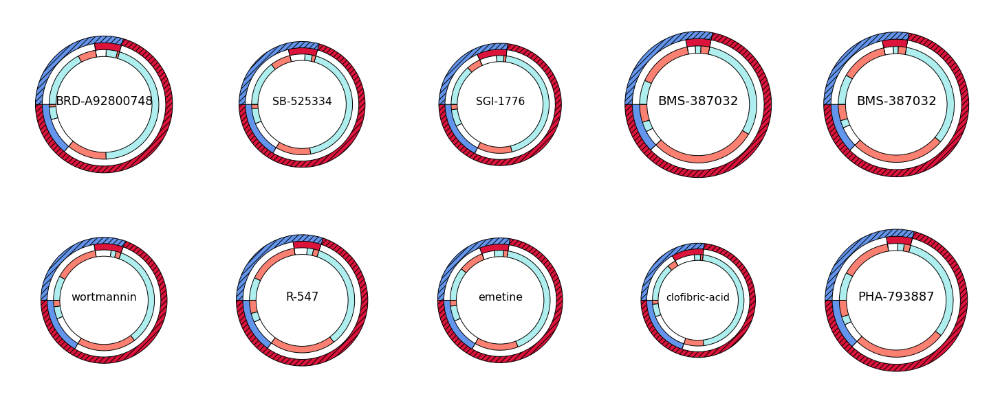

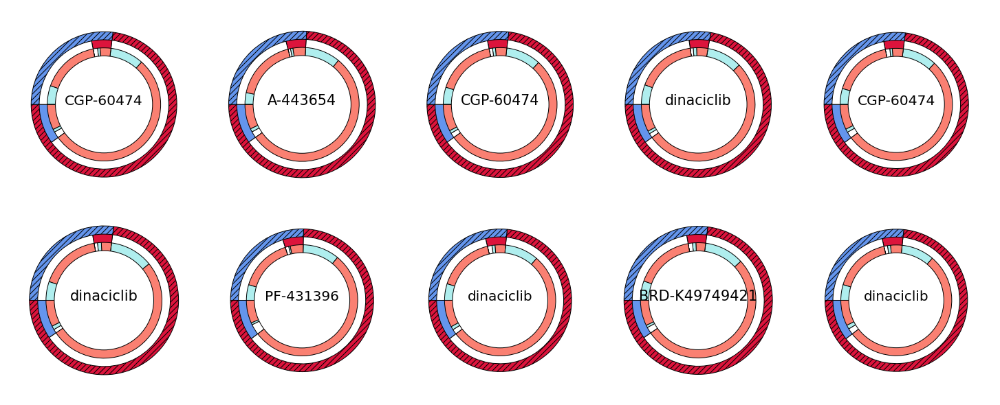

In [34]:
ring_matrix_plot(measurement='reverse_term',
                 compound_info=skcm_sig_info,
                 synergy_result=se_168294_skcm_cp,
                 resistance_signature=df(sig_168294_selected['NR']),
                 response_signature=df(sig_168294_selected['R']),
                 drug_signature=skcm_trt_cp,
                 plot_kwargs={'ring_size': 2, 'ring_width': 0.2, 'ft_size': 40},
                 save_path=None)

ring_matrix_plot(measurement='promoting_term',
                 compound_info=skcm_sig_info,
                 synergy_result=se_168294_skcm_cp,
                 resistance_signature=df(sig_168294_selected['NR']),
                 response_signature=df(sig_168294_selected['R']),
                 drug_signature=skcm_trt_cp,
                 plot_kwargs={'ring_size': 1.8, 'ring_width': 0.2, 'ft_size': 40},
                 save_path=None)

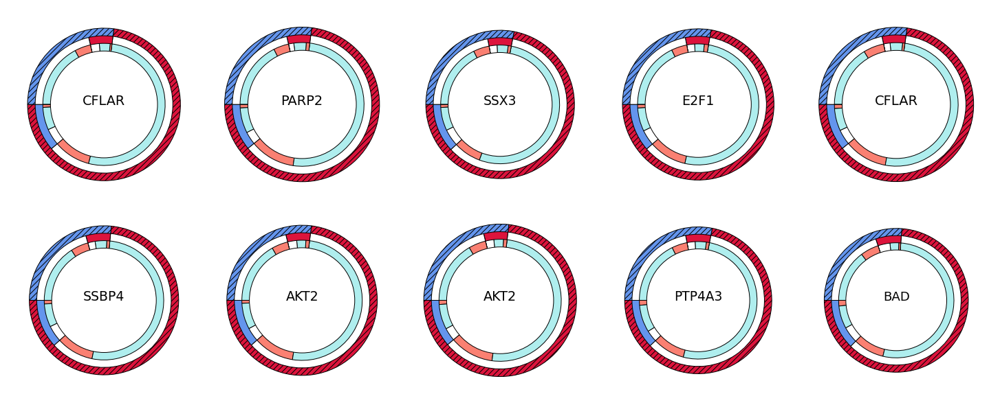

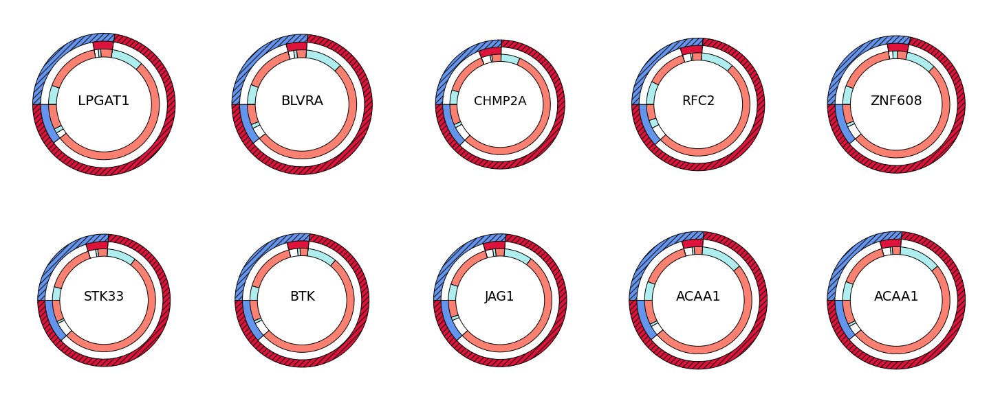

In [35]:
ring_matrix_plot(measurement='reverse_term',
                 compound_info=skcm_sig_info,
                 synergy_result=se_168294_skcm_sh,
                 resistance_signature=df(sig_168294_selected['NR']),
                 response_signature=df(sig_168294_selected['R']),
                 drug_signature=skcm_trt_sh,
                 plot_kwargs={'ring_size': 2, 'ring_width': 0.2, 'ft_size': 40},
                 save_path=None)

ring_matrix_plot(measurement='promoting_term',
                 compound_info=skcm_sig_info,
                 synergy_result=se_168294_skcm_sh,
                 resistance_signature=df(sig_168294_selected['NR']),
                 response_signature=df(sig_168294_selected['R']),
                 drug_signature=skcm_trt_sh,
                 plot_kwargs={'ring_size': 1.8, 'ring_width': 0.2, 'ft_size': 40},
                 save_path=None)

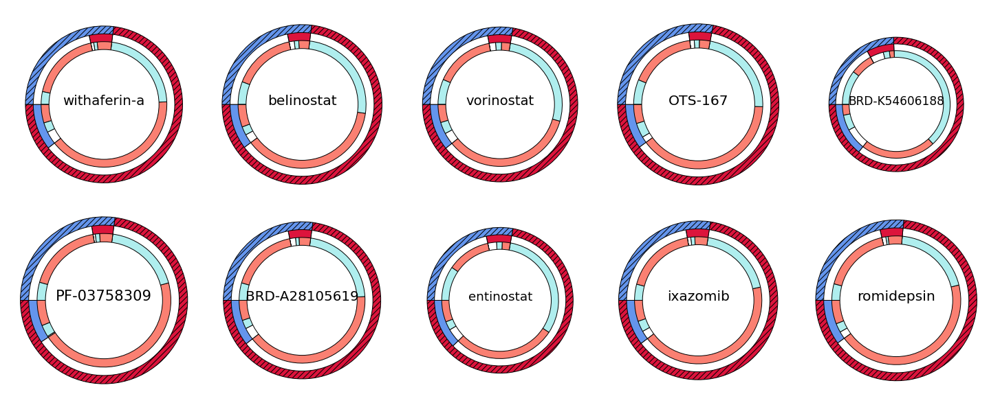

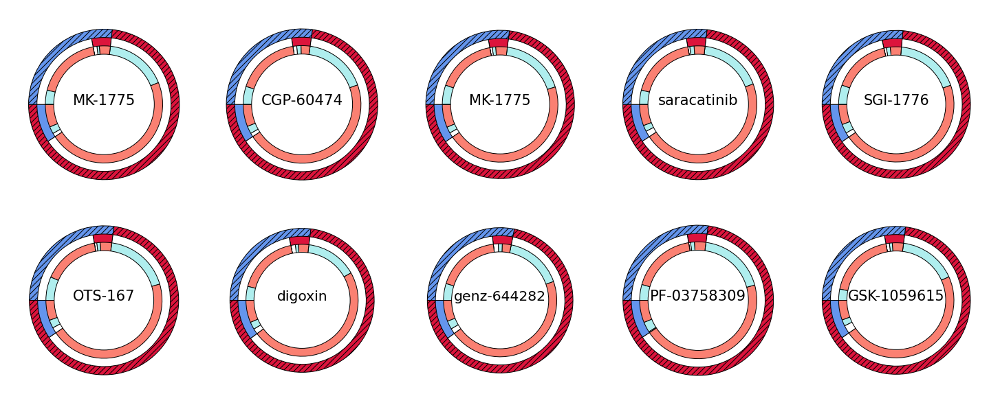

In [36]:
ring_matrix_plot(measurement='reverse_term',
                 compound_info=jurkat_lv5_sig_info,
                 synergy_result=se_168294_jurkat,
                 resistance_signature=df(sig_168294_selected['NR']),
                 response_signature=df(sig_168294_selected['R']),
                 drug_signature=jurkat_lv5_sig,
                 plot_kwargs={'ring_size': 2, 'ring_width': 0.2, 'ft_size': 40},
                 save_path=None)

ring_matrix_plot(measurement='promoting_term',
                 compound_info=jurkat_lv5_sig_info,
                 synergy_result=se_168294_jurkat,
                 resistance_signature=df(sig_168294_selected['NR']),
                 response_signature=df(sig_168294_selected['R']),
                 drug_signature=jurkat_lv5_sig,
                 plot_kwargs={'ring_size': 1.8, 'ring_width': 0.2, 'ft_size': 40},
                 save_path=None)

In [37]:
# add synergy evaluation
se_168294_skcm_sh['synergy_score'] = se_168294_skcm_sh['reverse_term'] / (1 - se_168294_skcm_sh['orth_term']) * se_168294_skcm_sh['direction_d']
se_168294_skcm_cp['synergy_score'] = se_168294_skcm_cp['reverse_term'] / (1 - se_168294_skcm_cp['orth_term']) * se_168294_skcm_cp['direction_d']
se_168294_jurkat['synergy_score'] = se_168294_jurkat['reverse_term'] / (1 - se_168294_jurkat['orth_term']) * se_168294_jurkat['direction_d']

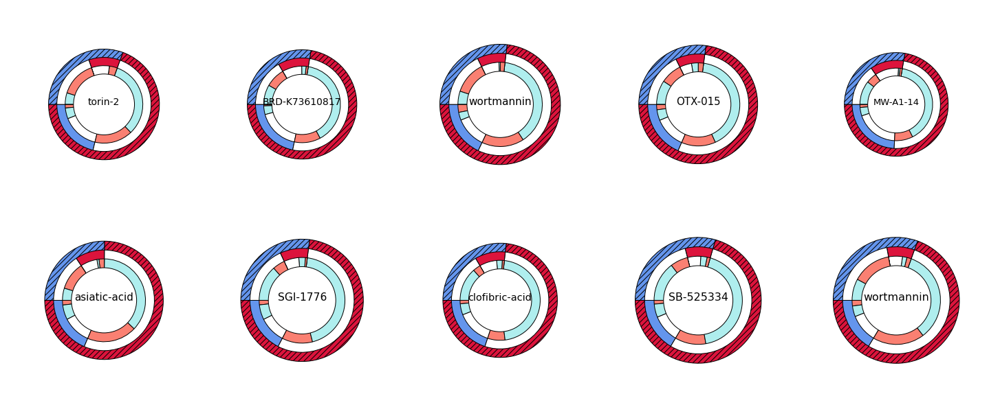

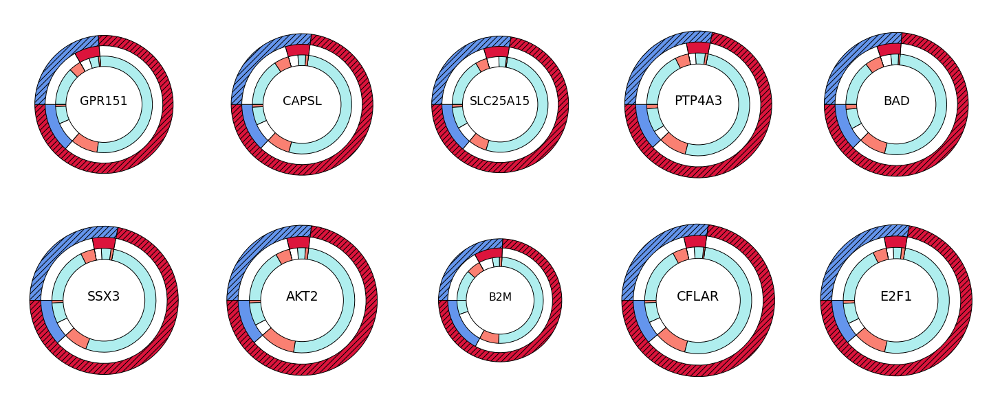

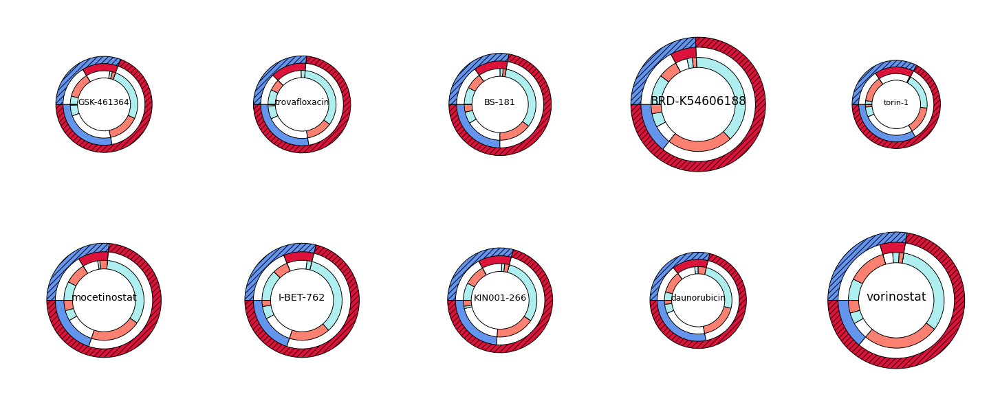

In [38]:
ring_matrix_plot(measurement='synergy_score',
                 compound_info=skcm_sig_info,
                 synergy_result=se_168294_skcm_cp,
                 resistance_signature=df(sig_168294_selected['NR']),
                 response_signature=df(sig_168294_selected['R']),
                 drug_signature=skcm_trt_cp,
                 plot_kwargs={'ring_size': 2, 'ring_width': 0.3, 'ft_size': 40},
                 save_path=None)

ring_matrix_plot(measurement='synergy_score',
                 compound_info=skcm_sig_info,
                 synergy_result=se_168294_skcm_sh,
                 resistance_signature=df(sig_168294_selected['NR']),
                 response_signature=df(sig_168294_selected['R']),
                 drug_signature=skcm_trt_sh,
                 plot_kwargs={'ring_size': 2, 'ring_width': 0.3, 'ft_size': 40},
                 save_path=None)

ring_matrix_plot(measurement='synergy_score',
                 compound_info=jurkat_lv5_sig_info,
                 synergy_result=se_168294_jurkat,
                 resistance_signature=df(sig_168294_selected['NR']),
                 response_signature=df(sig_168294_selected['R']),
                 drug_signature=jurkat_lv5_sig,
                 plot_kwargs={'ring_size': 2, 'ring_width': 0.3, 'ft_size': 40},
                 save_path=None)

In [39]:
se_168294_skcm_sh.rename(index=skcm_sig_info['cmap_name']).sort_values(by='synergy_score', ascending=False)

,reverse_term,promoting_term,direction_merged,direction_t,direction_d,orth_term,orth_term_r,synergy_score
GPR151,0.243139,0.06422,0.178919,0.082347,0.096572,0.492582,-0.188014,0.046274
CAPSL,0.243864,0.068227,0.175637,0.082347,0.09329,0.486902,-0.300823,0.044338
SLC25A15,0.242901,0.066198,0.176703,0.082347,0.094356,0.480847,-0.165687,0.044147
PTP4A3,0.246216,0.079744,0.166472,0.082347,0.084125,0.529935,-0.452409,0.044064
BAD,0.24616,0.069755,0.176404,0.082347,0.094057,0.471601,-0.365452,0.043818
...,...,...,...,...,...,...,...,...
BLVRA,0.162646,0.173107,-0.010461,0.082347,-0.092808,0.536797,-0.628672,-0.032588
JAG1,0.15465,0.166385,-0.011734,0.082347,-0.094081,0.557769,-0.474736,-0.032901
LPGAT1,0.165257,0.179705,-0.014448,0.082347,-0.096795,0.526027,-0.715629,-0.033749
CHMP2A,0.14341,0.169372,-0.025962,0.082347,-0.108309,0.549747,-0.393655,-0.034497


In [40]:
se_168294_skcm_sh.rename(index=skcm_sig_info['cmap_name']).sort_values(by='synergy_score', ascending=False).loc['EZH2', :]

,reverse_term,promoting_term,direction_merged,direction_t,direction_d,orth_term,orth_term_r,synergy_score
EZH2,0.141576,0.10749,0.034086,0.082347,-0.048261,0.470109,0.135135,-0.012894
EZH2,0.144205,0.129702,0.014503,0.082347,-0.067844,0.514381,-0.06228,-0.020146


# 2. GSE115821

In [76]:
# GSE115821 original expression
expr_115821 = pd.read_csv(data_home + 'GSE115821/GSE115821_MGH_counts_cleaned.csv',
                          index_col=0, header=0, sep=',')
expr_115821.index = expr_115821.index.astype(str)
# overlap with the L1000 space
expr_115821 = expr_115821[expr_115821.index.isin(brca_trt_cp.index)]

# read clinical information
info_115821 = pd.read_csv(data_home + 'GSE115821/GSE115821_patient_info.csv',
                          index_col=0, header=0, sep=',').T
print(expr_115821.shape, info_115821.shape)

(10077, 37) (23, 3)


In [77]:
pd.crosstab(info_115821['timepoint'], info_115821['response'])

response,response: NR,response: R
timepoint,,
treatment state: On Immune Checkpoint Blockade Therapy,14,1
treatment state: PRE Immune Checkpoint Blockade Therapy,5,1
treatment state: PRE Immune Checkpoint Blockade Therapy (On dabrafenib+trametinib),2,0


In [79]:
rename_state_115821 = {'treatment state: On Immune Checkpoint Blockade Therapy': 'POST',
                       'treatment state: PRE Immune Checkpoint Blockade Therapy': 'PRE',
                       'treatment state: PRE Immune Checkpoint Blockade Therapy (On dabrafenib+trametinib)': 'PRE'}

In [80]:
info_115821['time'] = ''
for p in info_115821.index:
    info_115821.at[p, 'time'] = rename_state_115821[info_115821.loc[p, 'timepoint']]
print(info_115821)

sample                                                        timepoint  \
115-031814.bam        treatment state: PRE Immune Checkpoint Blockad...   
115-041514.bam        treatment state: On Immune Checkpoint Blockade...   
MGH272-020415.bam     treatment state: On Immune Checkpoint Blockade...   
MGH272-121914.bam     treatment state: PRE Immune Checkpoint Blockad...   
MGH422-092815.bam     treatment state: PRE Immune Checkpoint Blockad...   
MGH422-110515.bam     treatment state: On Immune Checkpoint Blockade...   
MGH208_031115-1.bam   treatment state: PRE Immune Checkpoint Blockad...   
MGH208_031115-2.bam   treatment state: PRE Immune Checkpoint Blockad...   
MGH208_051315.bam     treatment state: On Immune Checkpoint Blockade...   
MGH39_033114.bam      treatment state: PRE Immune Checkpoint Blockad...   
MGH39_082514-1.bam    treatment state: On Immune Checkpoint Blockade...   
MGH39_082514-2.bam    treatment state: On Immune Checkpoint Blockade...   
MGH39_082514-3.bam    tre

In [81]:
log2exp2_115821 = np.log2(expr_115821 + 1)

# collapse duplicates
log2exp2_115821 = log2exp2_115821.groupby(level=0).mean()

In [83]:
log2exp2_115821.columns

Index(['39-3-31-14_S15.bam', 'MGH39_082514-1.bam', '208-9-10-14_S11.bam',
       'MGH42_101714.bam', 'MGH208_051315.bam', '62-10-2-13_S6.bam',
       '115-041514.bam', '115-031814.bam', '208-10-22-14_S12.bam',
       'MGH208_031115-2.bam', 'MGH42_112414.bam', '42-12-30-14_S5.bam',
       'MGH39_082514-4.bam', '39-10-31-14_S17.bam', 'MGH39_082514-3.bam',
       'MGH39_033114.bam', 'MGH42_112414_1.bam', 'MGH272-121914.bam',
       'MGH42_122914-1.bam', 'MGH39_082514-5.bam', 'MGH42_122914_1.bam',
       'MGH208_031115-1.bam', 'MGH422-092815.bam', 'MGH42_122914-2_1.bam',
       '148-6-5-14_S9.bam', 'MGH272-020415.bam', '42-10-17-14_S3.bam',
       'MGH42_101714_1.bam', '62-7-8-14_S8.bam', '208-5-13-15_S14.bam',
       'MGH39_082514-2.bam', '39-8-25-14_S16.bam', 'MGH39_103114.bam',
       'MGH422-110515.bam', '62-5-27-14_S7.bam', '42-11-24-14_S4.bam',
       '208-3-11-15_S13.bam'],
      dtype='object')

In [84]:
response_signature_115821 = {}

tmp_NR_pre = info_115821[(info_115821['time'] == 'PRE') & (info_115821['response'] == 'response: NR')]
tmp_NR_post = info_115821[(info_115821['time'] == 'POST') & (info_115821['response'] == 'response: NR')]
response_signature_115821['NR'] = construct_response_signature(l_post=log2exp2_115821[tmp_NR_post.index],
                                                        l_pre=log2exp2_115821[tmp_NR_pre.index])

tmp_R_pre = info_115821[(info_115821['time'] == 'PRE') & (info_115821['response'] == 'response: R')]
tmp_R_post = info_115821[(info_115821['time'] == 'POST') & (info_115821['response'] == 'response: R')]
response_signature_115821['R'] = construct_response_signature(l_post=log2exp2_115821[tmp_R_post.index],
                                                        l_pre=log2exp2_115821[tmp_R_pre.index])

In [85]:
print(response_signature_115821['NR']['dicho'].value_counts())
print(response_signature_115821['R']['dicho'].value_counts())

 1    890
-1    200
Name: dicho, dtype: int64
 1    3956
-1    1228
Name: dicho, dtype: int64


In [86]:
response_signature_115821['R']['dicho']

1-Mar       1
2-Mar      -1
4-Sep       1
6-Mar       1
6-Sep       1
           ..
ZSCAN5A     1
ZSWIM8      1
ZWINT       1
ZYX         1
ZZEF1       1
Name: dicho, Length: 5184, dtype: object

In [87]:
sig_115821 = pd.concat([df(response_signature_115821['R']['dicho']).rename(columns={'dicho': 'R'})['R'],
                        df(response_signature_115821['NR']['dicho']).rename(columns={'dicho': 'NR'})['NR']],
                       axis=1).fillna(0)
sig_115821

,R,NR
1-Mar,1,0
2-Mar,-1,0
4-Sep,1,0
6-Mar,1,0
6-Sep,1,0
...,...,...
XCL1,0,1
XKR8,0,1
ZC3H13,0,1
ZCWPW1,0,-1


In [96]:
# exclude signature genes with same direction in R and NR
sig_115821_multi = df(sig_115821['NR'] * sig_115821['R'])
sig_115821_multi = sig_115821_multi[sig_115821_multi[0] == 1].index

sig_115821_selected = sig_115821[~sig_115821.index.isin(sig_115821_multi)]
print(sig_115821_selected)

        R  NR
1-Mar   1   0
2-Mar  -1   0
4-Sep   1   0
6-Mar   1   0
6-Sep   1   0
...    ..  ..
XCL1    0   1
XKR8    0   1
ZC3H13  0   1
ZCWPW1  0  -1
ZNF426  0   1

[4928 rows x 2 columns]


NR  -1     0    1
R                
-1  54  1053  121
 0  57     0  255
 1  89  3353  514


NR,-1,0,1
R,,,
-1,54,1053,121
0,57,0,255
1,89,3353,514


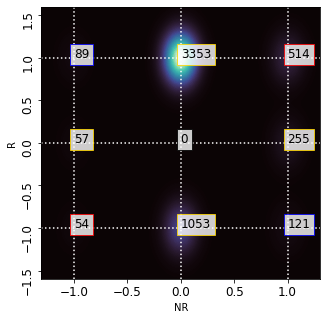

In [88]:
nebularplot(sig1=sig_115821['NR'],
            sig2=sig_115821['R'],
            save_path=None, drop_zero='off')

## 2.1 Run synergy evaluation

In [97]:
# output of the generalized synergy evaluation
se_115821_skcm_cp = df(index=skcm_trt_cp.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in skcm_trt_cp.columns:
    tmp_pert = df(skcm_trt_cp[pert]).groupby(level=0).mean()
    tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
    tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(sig_115821_selected['R']), sigR=df(sig_115821_selected['NR']))

    se_115821_skcm_cp.at[pert, 'reverse_term'] = tmp_result[0]
    se_115821_skcm_cp.at[pert, 'promoting_term'] = tmp_result[1]
    se_115821_skcm_cp.at[pert, 'direction_merged'] = tmp_result[2]
    se_115821_skcm_cp.at[pert, 'direction_d'] = tmp_result[3]
    se_115821_skcm_cp.at[pert, 'direction_t'] = tmp_result[4]
    se_115821_skcm_cp.at[pert, 'orth_term'] = tmp_result[5]
    se_115821_skcm_cp.at[pert, 'orth_term_r'] = tmp_result[6]

se_115821_skcm_cp = se_115821_skcm_cp.dropna(axis=0, how='any')

In [98]:
# output of the generalized synergy evaluation
se_115821_skcm_sh = df(index=skcm_trt_sh.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in skcm_trt_sh.columns:
    tmp_pert = df(skcm_trt_sh[pert]).groupby(level=0).mean()
    tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
    tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(sig_115821_selected['R']), sigR=df(sig_115821_selected['NR']))

    se_115821_skcm_sh.at[pert, 'reverse_term'] = tmp_result[0]
    se_115821_skcm_sh.at[pert, 'promoting_term'] = tmp_result[1]
    se_115821_skcm_sh.at[pert, 'direction_merged'] = tmp_result[2]
    se_115821_skcm_sh.at[pert, 'direction_d'] = tmp_result[3]
    se_115821_skcm_sh.at[pert, 'direction_t'] = tmp_result[4]
    se_115821_skcm_sh.at[pert, 'orth_term'] = tmp_result[5]
    se_115821_skcm_sh.at[pert, 'orth_term_r'] = tmp_result[6]

se_115821_skcm_sh = se_115821_skcm_sh.dropna(axis=0, how='any')

In [104]:
# output of the generalized synergy evaluation
se_115821_jurkat = df(index=jurkat_lv5_sig.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in jurkat_lv5_sig.columns:
    if pert not in ['disease_sig', 'reference_sig']:
        tmp_pert = df(jurkat_lv5_sig[pert]).groupby(level=0).mean()
        tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
        tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(sig_115821_selected['R']), sigR=df(sig_115821_selected['NR']))

        se_115821_jurkat.at[pert, 'reverse_term'] = tmp_result[0]
        se_115821_jurkat.at[pert, 'promoting_term'] = tmp_result[1]
        se_115821_jurkat.at[pert, 'direction_merged'] = tmp_result[2]
        se_115821_jurkat.at[pert, 'direction_d'] = tmp_result[3]
        se_115821_jurkat.at[pert, 'direction_t'] = tmp_result[4]
        se_115821_jurkat.at[pert, 'orth_term'] = tmp_result[5]
        se_115821_jurkat.at[pert, 'orth_term_r'] = tmp_result[6]

se_115821_jurkat = se_115821_jurkat.dropna(axis=0, how='any')

In [105]:
# add synergy evaluation
se_115821_skcm_sh['synergy_score'] = se_115821_skcm_sh['reverse_term'] / (1 - se_115821_skcm_sh['orth_term']) * se_115821_skcm_sh['direction_d']
se_115821_skcm_cp['synergy_score'] = se_115821_skcm_cp['reverse_term'] / (1 - se_115821_skcm_cp['orth_term']) * se_115821_skcm_cp['direction_d']
se_115821_jurkat['synergy_score'] = se_115821_jurkat['reverse_term'] / (1 - se_115821_jurkat['orth_term']) * se_115821_jurkat['direction_d']

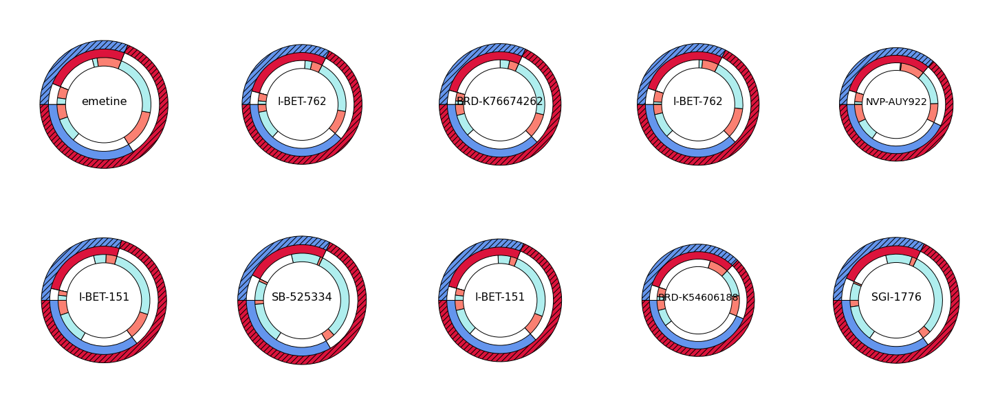

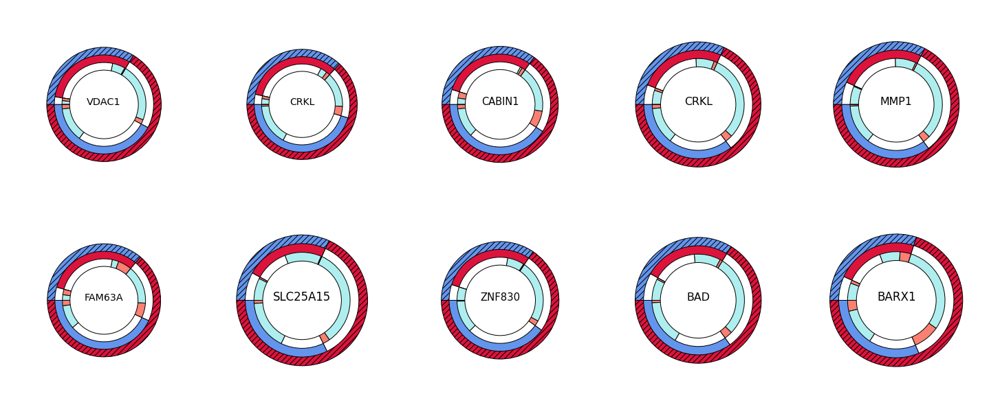

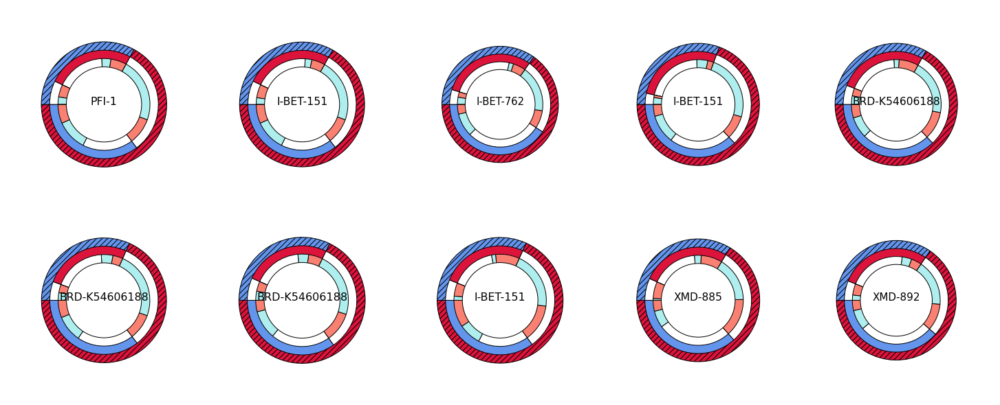

In [109]:
ring_matrix_plot(measurement='synergy_score',
                 compound_info=skcm_sig_info,
                 synergy_result=se_115821_skcm_cp,
                 resistance_signature=df(sig_115821_selected['NR']),
                 response_signature=df(sig_115821_selected['R']),
                 drug_signature=skcm_trt_cp,
                 plot_kwargs={'ring_size': 3, 'ring_width': 0.4, 'ft_size': 60},
                 save_path=None)

ring_matrix_plot(measurement='synergy_score',
                 compound_info=skcm_sig_info,
                 synergy_result=se_115821_skcm_sh,
                 resistance_signature=df(sig_115821_selected['NR']),
                 response_signature=df(sig_115821_selected['R']),
                 drug_signature=skcm_trt_sh,
                 plot_kwargs={'ring_size': 3, 'ring_width': 0.4, 'ft_size': 60},
                 save_path=None)

ring_matrix_plot(measurement='synergy_score',
                 compound_info=jurkat_lv5_sig_info,
                 synergy_result=se_115821_jurkat,
                 resistance_signature=df(sig_115821_selected['NR']),
                 response_signature=df(sig_115821_selected['R']),
                 drug_signature=jurkat_lv5_sig,
                 plot_kwargs={'ring_size': 3, 'ring_width': 0.4, 'ft_size': 60},
                 save_path=None)

# 3. Merged MGH sets

In [110]:
# compare two MGH datasets
sig_merged_NR = pd.concat([df(response_signature['NR']['dicho']).rename(columns={'dicho': 'NR_168204'})['NR_168204'],
                        df(response_signature_115821['NR']['dicho']).rename(columns={'dicho': 'NR_115821'})['NR_115821']],
                       axis=1).fillna(0)

sig_merged_R = pd.concat([df(response_signature['R']['dicho']).rename(columns={'dicho': 'R_168204'})['R_168204'],
                        df(response_signature_115821['R']['dicho']).rename(columns={'dicho': 'R_115821'})['R_115821']],
                       axis=1).fillna(0)

R_168204   -1     0    1
R_115821                
-1        292   808  128
 0        665     0  336
 1        371  2827  758
NR_168204   -1    0    1
NR_115821               
-1          36  105   59
 0         246    0  808
 1          44  622  224


NR_168204,-1,0,1
NR_115821,,,
-1,36,105,59
0,246,0,808
1,44,622,224


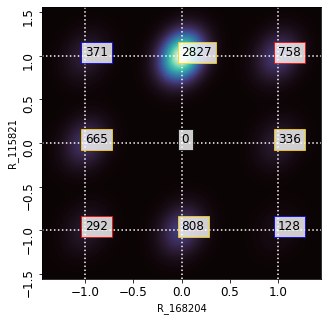

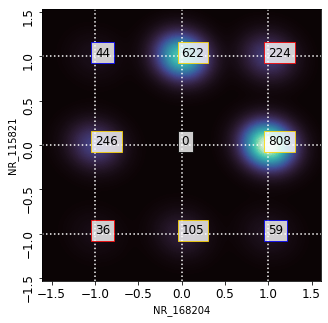

In [111]:
nebularplot(sig1=sig_merged_R['R_168204'],
            sig2=sig_merged_R['R_115821'],
            save_path=None, drop_zero='off')


nebularplot(sig1=sig_merged_NR['NR_168204'],
            sig2=sig_merged_NR['NR_115821'],
            save_path=None, drop_zero='off')

In [115]:
sig_merged_NR['merged_indicator'] = sig_merged_NR['NR_115821'] * sig_merged_NR['NR_168204']
sig_merged_NR_final = df(sig_merged_NR[sig_merged_NR['merged_indicator'] == 1.]['NR_115821']).rename(columns={'NR_115821': 'NR_merged'})

sig_merged_R['merged_indicator'] = sig_merged_R['R_115821'] * sig_merged_R['R_168204']
sig_merged_R_final = df(sig_merged_R[sig_merged_R['merged_indicator'] == 1.]['R_115821']).rename(columns={'R_115821': 'R_merged'})

In [121]:
print(sig_merged_NR_final.value_counts())
print(sig_merged_R_final.value_counts())  

NR_merged
 1           224
-1            36
dtype: int64
R_merged
 1          758
-1          292
dtype: int64


In [124]:
sig_final_merged = pd.concat([sig_merged_NR_final['NR_merged'],
                        sig_merged_R_final['R_merged']],
                       axis=1).fillna(0)
sig_final_merged

,NR_merged,R_merged
ABCB1,1.0,1.0
ABCB4,1.0,0.0
ABCD2,1.0,0.0
ACKR1,1.0,0.0
ACSF2,1.0,1.0
...,...,...
ZNF415,0.0,1.0
ZNF675,0.0,1.0
ZNF711,0.0,1.0
ZNF750,0.0,1.0


NR_merged  -1.0   0.0   1.0
R_merged                   
-1.0         12   279     1
 0.0         23     0   162
 1.0          1   696    61


NR_merged,-1.0,0.0,1.0
R_merged,,,
-1.0,12,279,1
0.0,23,0,162
1.0,1,696,61


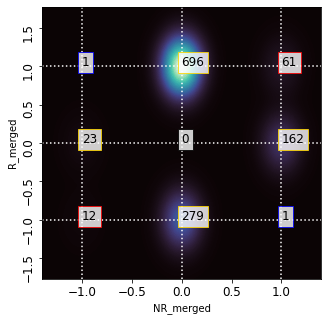

In [125]:
nebularplot(sig1=sig_final_merged['NR_merged'],
            sig2=sig_final_merged['R_merged'],
            save_path=None, drop_zero='off')

In [128]:
# exclude signature genes with same direction in R and NR
sig_final_multi = df(sig_final_merged['NR_merged'] * sig_final_merged['R_merged'])
sig_final_multi = sig_final_multi[sig_final_multi[0] == 1].index

sig_final_selected = sig_final_merged[~sig_final_merged.index.isin(sig_final_multi)]
print(sig_final_selected)

         NR_merged  R_merged
ABCB4          1.0       0.0
ABCD2          1.0       0.0
ACKR1          1.0       0.0
ACTC1         -1.0       0.0
ADAMTS5        1.0       0.0
...            ...       ...
ZNF415         0.0       1.0
ZNF675         0.0       1.0
ZNF711         0.0       1.0
ZNF750         0.0       1.0
ZNHIT1         0.0      -1.0

[1162 rows x 2 columns]


In [129]:
# output of the generalized synergy evaluation
se_merged_skcm_cp = df(index=skcm_trt_cp.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in skcm_trt_cp.columns:
    tmp_pert = df(skcm_trt_cp[pert]).groupby(level=0).mean()
    tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
    tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(sig_final_selected['R_merged']), sigR=df(sig_final_selected['NR_merged']))

    se_merged_skcm_cp.at[pert, 'reverse_term'] = tmp_result[0]
    se_merged_skcm_cp.at[pert, 'promoting_term'] = tmp_result[1]
    se_merged_skcm_cp.at[pert, 'direction_merged'] = tmp_result[2]
    se_merged_skcm_cp.at[pert, 'direction_d'] = tmp_result[3]
    se_merged_skcm_cp.at[pert, 'direction_t'] = tmp_result[4]
    se_merged_skcm_cp.at[pert, 'orth_term'] = tmp_result[5]
    se_merged_skcm_cp.at[pert, 'orth_term_r'] = tmp_result[6]

se_merged_skcm_cp = se_merged_skcm_cp.dropna(axis=0, how='any')

In [130]:
# output of the generalized synergy evaluation
se_merged_skcm_sh = df(index=skcm_trt_sh.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in skcm_trt_sh.columns:
    tmp_pert = df(skcm_trt_sh[pert]).groupby(level=0).mean()
    tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
    tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(sig_final_selected['R_merged']), sigR=df(sig_final_selected['NR_merged']))

    se_merged_skcm_sh.at[pert, 'reverse_term'] = tmp_result[0]
    se_merged_skcm_sh.at[pert, 'promoting_term'] = tmp_result[1]
    se_merged_skcm_sh.at[pert, 'direction_merged'] = tmp_result[2]
    se_merged_skcm_sh.at[pert, 'direction_d'] = tmp_result[3]
    se_merged_skcm_sh.at[pert, 'direction_t'] = tmp_result[4]
    se_merged_skcm_sh.at[pert, 'orth_term'] = tmp_result[5]
    se_merged_skcm_sh.at[pert, 'orth_term_r'] = tmp_result[6]

se_merged_skcm_sh = se_merged_skcm_sh.dropna(axis=0, how='any')

In [132]:
# output of the generalized synergy evaluation
se_merged_jurkat = df(index=jurkat_lv5_sig.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in jurkat_lv5_sig.columns:
    if pert not in ['disease_sig', 'reference_sig']:
        tmp_pert = df(jurkat_lv5_sig[pert]).groupby(level=0).mean()
        tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
    tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(sig_final_selected['R_merged']), sigR=df(sig_final_selected['NR_merged']))

    se_merged_jurkat.at[pert, 'reverse_term'] = tmp_result[0]
    se_merged_jurkat.at[pert, 'promoting_term'] = tmp_result[1]
    se_merged_jurkat.at[pert, 'direction_merged'] = tmp_result[2]
    se_merged_jurkat.at[pert, 'direction_d'] = tmp_result[3]
    se_merged_jurkat.at[pert, 'direction_t'] = tmp_result[4]
    se_merged_jurkat.at[pert, 'orth_term'] = tmp_result[5]
    se_merged_jurkat.at[pert, 'orth_term_r'] = tmp_result[6]

se_merged_jurkat = se_merged_jurkat.dropna(axis=0, how='any')

In [134]:
# add synergy evaluation
se_merged_skcm_sh['synergy_score'] = se_merged_skcm_sh['reverse_term'] / (1 - se_merged_skcm_sh['orth_term']) * se_merged_skcm_sh['direction_d']
se_merged_skcm_cp['synergy_score'] = se_merged_skcm_cp['reverse_term'] / (1 - se_merged_skcm_cp['orth_term']) * se_merged_skcm_cp['direction_d']
se_merged_jurkat['synergy_score'] = se_merged_jurkat['reverse_term'] / (1 - se_merged_jurkat['orth_term']) * se_merged_jurkat['direction_d']

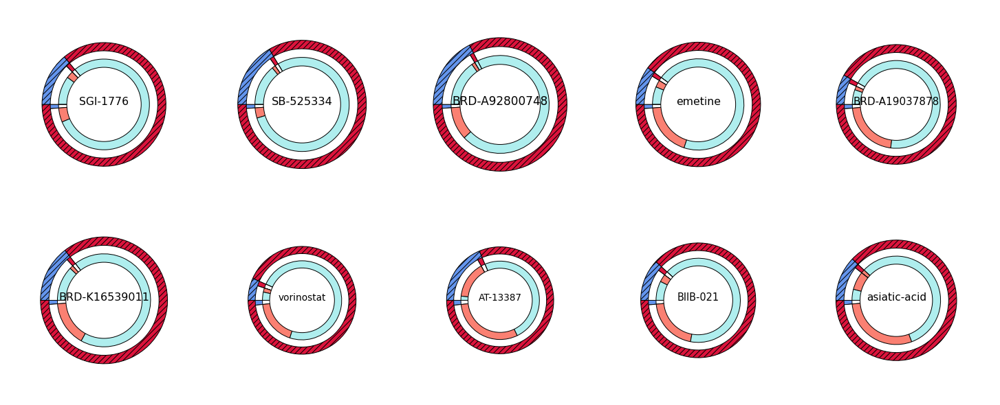

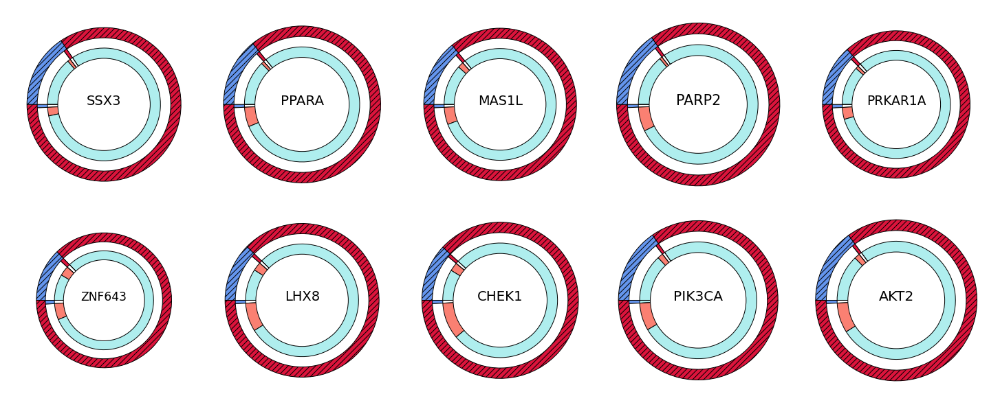

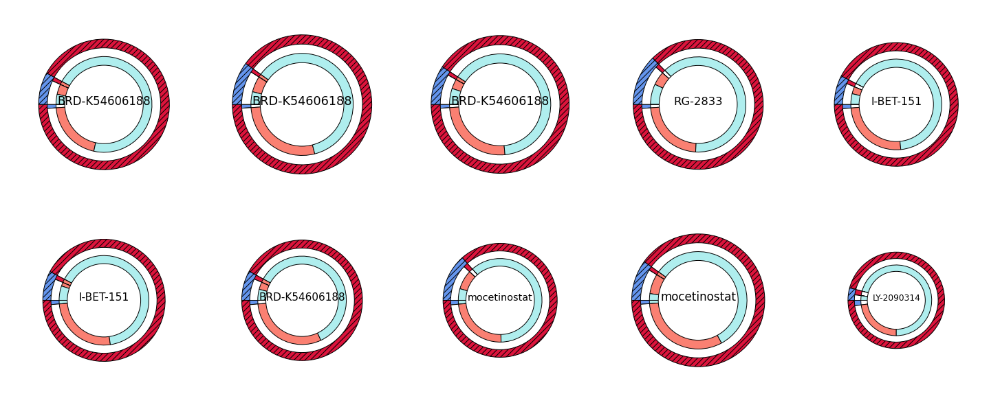

In [136]:
ring_matrix_plot(measurement='synergy_score',
                 compound_info=skcm_sig_info,
                 synergy_result=se_merged_skcm_cp,
                 resistance_signature=df(sig_final_selected['NR_merged']),
                 response_signature=df(sig_final_selected['R_merged']),
                 drug_signature=skcm_trt_cp,
                 plot_kwargs={'ring_size': 3, 'ring_width': 0.4, 'ft_size': 60},
                 save_path=None)

ring_matrix_plot(measurement='synergy_score',
                 compound_info=skcm_sig_info,
                 synergy_result=se_merged_skcm_sh,
                 resistance_signature=df(sig_final_selected['NR_merged']),
                 response_signature=df(sig_final_selected['R_merged']),
                 drug_signature=skcm_trt_sh,
                 plot_kwargs={'ring_size': 3, 'ring_width': 0.4, 'ft_size': 60},
                 save_path=None)

ring_matrix_plot(measurement='synergy_score',
                 compound_info=jurkat_lv5_sig_info,
                 synergy_result=se_merged_jurkat,
                 resistance_signature=df(sig_final_selected['NR_merged']),
                 response_signature=df(sig_final_selected['R_merged']),
                 drug_signature=jurkat_lv5_sig,
                 plot_kwargs={'ring_size': 3, 'ring_width': 0.4, 'ft_size': 60},
                 save_path=None)

# 4. GSE91061

In [6]:
# GSE91061 original expression
expr_91061 = pd.read_csv(data_home + 'GSE91061/GSE91061_BMS038109Sample.hg19KnownGene.fpkm.csv',
                          index_col=0, header=0, sep=',')
expr_91061 = expr_91061[expr_91061.index.isin(bing_landmark.index)]
expr_91061 = expr_91061.rename(index=bing_landmark['Official NCBI gene symbol'])

In [7]:
expr_91061.shape

(10158, 109)

In [8]:
expr_91061.head()

,Pt1_Pre_AD101148-6,Pt1_On_AD174047-6,Pt10_Pre_E9047565-6,Pt10_On_E9047632-6,Pt101_Pre_AD486328-5,Pt101_On_AD681975-5,Pt103_Pre_AE134058-2,Pt103_On_AE134059-6,Pt105_On_AE373241-6,Pt106_Pre_AD502250-5,...,Pt9_Pre_E9021024-6,Pt9_On_E9047644-7,Pt90_Pre_AD467873-6,Pt92_Pre_AE134060-5,Pt92_On_AE148750-5,Pt93_On_AE070988-5,Pt94_Pre_AD732850-6,Pt94_On_AE373242-6,Pt98_Pre_AD733586-8,Pt98_On_AE086717-6
ADA,10.027219,4.170643,10.017708,12.241966,27.412639,29.409310,19.336752,2.647676,11.945614,12.125976,...,6.106330,6.381909,13.046369,13.869151,21.216114,1.682833,9.543218,4.421732,3.790089,6.994346
CDH2,0.407255,0.040319,1.183365,3.737245,1.313282,2.645249,0.142493,0.020004,0.427601,16.134949,...,30.383779,37.943956,1.793913,3.697619,3.170839,0.256164,0.971044,10.310559,1.163395,0.832457
AKT3,25.274036,36.018795,46.562887,53.313169,8.721540,9.484339,5.047087,22.930653,16.334390,29.810245,...,29.089234,28.169557,13.643286,21.834762,18.416663,25.733070,19.154000,10.078965,21.396885,25.171776
MED6,14.065518,13.557886,5.473365,8.160655,15.165352,13.660269,6.639855,7.515382,7.510333,13.610868,...,11.177203,10.981526,6.975856,8.293790,9.787363,10.319384,9.008512,5.283491,10.386034,12.200633
NAALAD2,0.170641,0.118578,0.445566,0.323816,0.102411,0.457202,0.504378,0.311980,0.086393,0.553812,...,0.786280,0.591012,0.261017,0.319791,0.202308,0.165954,0.308832,0.329710,0.246384,0.549217


In [13]:
# overlap with the L1000 space
expr_91061 = expr_91061[expr_91061.index.isin(brca_trt_cp.index)]

# read clinical information
info_91061 = pd.read_csv(data_home + 'GSE91061/GSE91061_patient_info.csv',
                          index_col=0, header=0, sep=',').T
print(expr_91061.shape, info_91061.shape)

(10140, 109) (109, 2)


In [14]:
info_91061

sample,timepoint,response
Pt1_Pre_AD101148-6,visit (pre or on treatment): Pre,response: PD
Pt1_On_AD174047-6,visit (pre or on treatment): On,response: PD
Pt2_Pre_AD101150-6,visit (pre or on treatment): Pre,response: SD
Pt2_On_AD174046-6,visit (pre or on treatment): On,response: SD
Pt23_On_AD486568-8,visit (pre or on treatment): On,response: UNK
...,...,...
Pt106_Pre_AD502250-5,visit (pre or on treatment): Pre,response: PD
Pt106_On_AD513626-6,visit (pre or on treatment): On,response: PD
Pt34_On_AD485757-6,visit (pre or on treatment): On,response: PRCR
Pt34_Pre_AD466985-6,visit (pre or on treatment): Pre,response: PRCR


In [15]:
pd.crosstab(info_91061['timepoint'], info_91061['response'])

response,response: PD,response: PRCR,response: SD,response: UNK
timepoint,,,,
visit (pre or on treatment): On,25,13,18,2
visit (pre or on treatment): Pre,23,10,16,2


In [21]:
# get the paired sample list
timepoint_91061 = df(columns=['Pre', 'On', 'response'])
for p in info_91061.index:
    tmp_cat = p.split('_')[1]
    tmp_p = p.split('_')[0]
    timepoint_91061.at[tmp_p, tmp_cat] = p
    timepoint_91061.at[tmp_p, 'response'] = info_91061.loc[p, 'response'].split(': ')[1]

# get the patients with paired samples
paired_91061 = timepoint_91061.dropna(axis=0, how='any')

print(timepoint_91061.shape, paired_91061.shape)

(65, 3) (43, 3)


In [22]:
paired_91061

,Pre,On,response
Pt1,Pt1_Pre_AD101148-6,Pt1_On_AD174047-6,PD
Pt2,Pt2_Pre_AD101150-6,Pt2_On_AD174046-6,SD
Pt23,Pt23_Pre_AD313075-5,Pt23_On_AD486568-8,UNK
Pt82,Pt82_Pre_AD823914-8,Pt82_On_AD125218-6,SD
Pt49,Pt49_Pre_AD667851-6,Pt49_On_AD681976-5,PRCR
Pt85,Pt85_Pre_AD486329-5,Pt85_On_AE070989-10,PD
Pt89,Pt89_Pre_AE070951-5,Pt89_On_AE070987-5,SD
Pt101,Pt101_Pre_AD486328-5,Pt101_On_AD681975-5,PRCR
Pt47,Pt47_Pre_AD506073-6,Pt47_On_AD530367-6,PD
Pt52,Pt52_Pre_AD506075-6,Pt52_On_AD530365-6,PD


In [23]:
response_lut = {'PD': 'crimson', 'SD': 'royalblue', 'PRCR': 'cornflowerblue', 'UNK': 'grey'}
patient_color = df(index=info_91061.index, columns=['response', 'response_color', 'time', 'time_color'])
for p in paired_91061.index:
    patient_color.at[paired_91061.loc[p, 'Pre'], 'time'] = 'Pre'
    patient_color.at[paired_91061.loc[p, 'On'], 'time'] = 'On'
    patient_color.at[paired_91061.loc[p, 'Pre'], 'time_color'] = 'violet'
    patient_color.at[paired_91061.loc[p, 'On'], 'time_color'] = 'gold'
    patient_color.at[paired_91061.loc[p, 'Pre'], 'response'] = paired_91061.loc[p, 'response']
    patient_color.at[paired_91061.loc[p, 'On'], 'response'] = paired_91061.loc[p, 'response']
    patient_color.at[paired_91061.loc[p, 'Pre'], 'response_color'] = response_lut[paired_91061.loc[p, 'response']]
    patient_color.at[paired_91061.loc[p, 'On'], 'response_color'] = response_lut[paired_91061.loc[p, 'response']]
patient_color = patient_color.dropna(axis=0, how='any')

In [24]:
# add color for paired_91061
for p in paired_91061.index:
    paired_91061.at[p, 'response_color'] = response_lut[paired_91061.loc[p, 'response']]

C:\Users\ywang\AppData\Local\Programs\Python\Python37\lib\site-packages\pandas\core\indexing.py:1684: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self.obj[key] = infer_fill_value(value)
C:\Users\ywang\AppData\Local\Programs\Python\Python37\lib\site-packages\pandas\core\indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [25]:
paired_91061['response'].value_counts()

PD      18
SD      15
PRCR     9
UNK      1
Name: response, dtype: int64

In [26]:
log2exp2_91061 = np.log2(expr_91061 + 1) # log2FPKM

# collapse duplicates
log2exp2_91061 = log2exp2_91061.groupby(level=0).mean()

log2exp2_91061 = log2exp2_91061[log2exp2_91061 > 0.].dropna(axis=0, how='all').fillna(0.)
print(log2exp2_91061.shape)

(10139, 109)


In [27]:
response_signature_91061 = {}

tmp_NR_pre = list(paired_91061[paired_91061['response'].isin(['PD'])]['Pre'])
tmp_NR_post = list(paired_91061[paired_91061['response'].isin(['PD'])]['On'])
response_signature_91061['NR'] = construct_response_signature_paired(l_post=log2exp2_91061[tmp_NR_post],
                                                        l_pre=log2exp2_91061[tmp_NR_pre])

tmp_R_pre = list(paired_91061[paired_91061['response'].isin(['SD', 'PRCR'])]['Pre'])
tmp_R_post = list(paired_91061[paired_91061['response'].isin(['SD', 'PRCR'])]['On'])
response_signature_91061['R'] = construct_response_signature_paired(l_post=log2exp2_91061[tmp_R_post],
                                                        l_pre=log2exp2_91061[tmp_R_pre])

tmp_SD_pre = list(paired_91061[paired_91061['response'].isin(['SD'])]['Pre'])
tmp_SD_post = list(paired_91061[paired_91061['response'].isin(['SD'])]['On'])
response_signature_91061['SD'] = construct_response_signature_paired(l_post=log2exp2_91061[tmp_SD_post],
                                                        l_pre=log2exp2_91061[tmp_SD_pre])

tmp_PRCR_pre = list(paired_91061[paired_91061['response'].isin(['PRCR'])]['Pre'])
tmp_PRCR_post = list(paired_91061[paired_91061['response'].isin(['PRCR'])]['On'])
response_signature_91061['PRCR'] = construct_response_signature_paired(l_post=log2exp2_91061[tmp_PRCR_post],
                                                        l_pre=log2exp2_91061[tmp_PRCR_pre])

C:\Users\ywang\AppData\Local\Programs\Python\Python37\lib\site-packages\scipy\stats\morestats.py:3141: UserWarning: Exact p-value calculation does not work if there are ties. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
C:\Users\ywang\AppData\Local\Programs\Python\Python37\lib\site-packages\scipy\stats\morestats.py:3155: UserWarning: Sample size too small for normal approximation.
  warnings.warn("Sample size too small for normal approximation.")


In [28]:
print(response_signature_91061['NR'])
print(response_signature_91061['R'])
print(response_signature_91061['SD'])
print(response_signature_91061['PRCR'])

       log2FC(P-N) ranksum_stat ranksum_p
A2M       0.340822         61.0  0.303795
A4GALT   -0.019403         82.0  0.898575
AAAS      0.102213         52.0  0.154045
AACS      0.159473         47.0   0.09874
AADAC     0.283644         75.0  0.647315
...            ...          ...       ...
ZWINT     0.008575         85.0       1.0
ZXDC        0.1304         65.0  0.392738
ZYX       0.053053         84.0  0.966118
ZZEF1      0.10043         70.0  0.522614
ZZZ3      0.125497         70.0  0.522614

[10139 rows x 3 columns]
       log2FC(P-N) ranksum_stat ranksum_p
A2M       0.448897         78.0  0.039482
A4GALT    0.304684        102.0   0.17798
AAAS     -0.159337        103.0  0.187501
AACS     -0.220589         63.0  0.011516
AADAC     0.212291        111.0  0.264913
...            ...          ...       ...
ZWINT    -0.340063         80.0   0.04568
ZXDC     -0.032034        141.0  0.811536
ZYX       0.184733        107.0   0.22919
ZZEF1      0.03083        117.0  0.359626
ZZZ3    

In [29]:
response_signature_91061['NR']['log10P'] = -np.log10(response_signature_91061['NR']['ranksum_p'].astype(float))
response_signature_91061['R']['log10P'] = -np.log10(response_signature_91061['R']['ranksum_p'].astype(float))
response_signature_91061['SD']['log10P'] = -np.log10(response_signature_91061['SD']['ranksum_p'].astype(float))
response_signature_91061['PRCR']['log10P'] = -np.log10(response_signature_91061['PRCR']['ranksum_p'].astype(float))

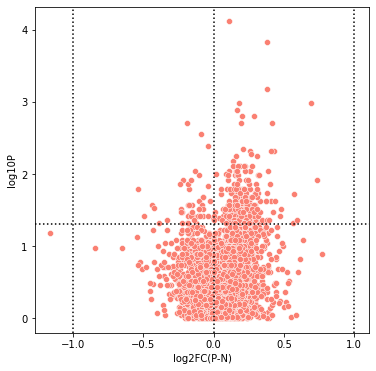

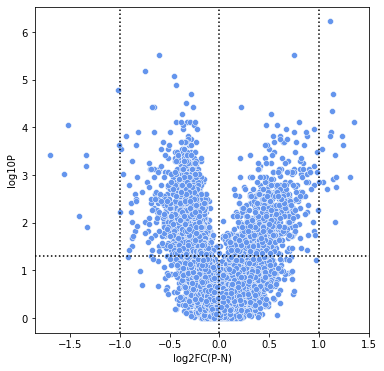

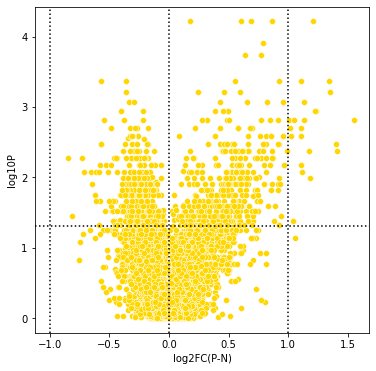

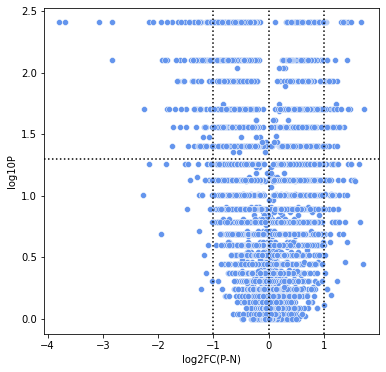

In [29]:
# volcano: NR
plt.figure(figsize=(6, 6))
sns.scatterplot(x='log2FC(P-N)', y='log10P', data=response_signature_91061['NR'], color='salmon')
plt.axvline(x=0., ls=':', c='k')
plt.axvline(x=1., ls=':', c='k')
plt.axvline(x=-1, ls=':', c='k')
plt.axhline(y=-np.log10(0.05), ls=':', c='k')
plt.show()

# volcano: R
plt.figure(figsize=(6, 6))
sns.scatterplot(x='log2FC(P-N)', y='log10P', data=response_signature_91061['R'], color='cornflowerblue')
plt.axvline(x=0., ls=':', c='k')
plt.axvline(x=1., ls=':', c='k')
plt.axvline(x=-1, ls=':', c='k')
plt.axhline(y=-np.log10(0.05), ls=':', c='k')
plt.show()

# volcano: SD
plt.figure(figsize=(6, 6))
sns.scatterplot(x='log2FC(P-N)', y='log10P', data=response_signature_91061['SD'], color='gold')
plt.axvline(x=0., ls=':', c='k')
plt.axvline(x=1., ls=':', c='k')
plt.axvline(x=-1, ls=':', c='k')
plt.axhline(y=-np.log10(0.05), ls=':', c='k')
plt.show()

# volcano: PRCR
plt.figure(figsize=(6, 6))
sns.scatterplot(x='log2FC(P-N)', y='log10P', data=response_signature_91061['PRCR'], color='cornflowerblue')
plt.axvline(x=0., ls=':', c='k')
plt.axvline(x=1., ls=':', c='k')
plt.axvline(x=-1, ls=':', c='k')
plt.axhline(y=-np.log10(0.05), ls=':', c='k')
plt.show()

In [30]:
merged_deg_91061 = pd.concat([response_signature_91061['R'].rename(columns={'log2FC(P-N)': 'R_fc'})['R_fc'],
                              response_signature_91061['NR'].rename(columns={'log2FC(P-N)': 'NR_fc'})['NR_fc'],
                              response_signature_91061['R'].rename(columns={'log10P': 'R_log10P'})['R_log10P'],
                              response_signature_91061['NR'].rename(columns={'log10P': 'NR_log10P'})['NR_log10P']
                             ], axis=1)
merged_deg_91061

,R_fc,NR_fc,R_log10P,NR_log10P
A2M,0.448897,0.340822,1.403605,0.517420
A4GALT,0.304684,-0.019403,0.749628,0.046446
AAAS,-0.159337,0.102213,0.726996,0.812352
AACS,-0.220589,0.159473,1.938695,1.005509
AADAC,0.212291,0.283644,0.576897,0.188884
...,...,...,...,...
ZWINT,-0.340063,0.008575,1.340277,-0.000000
ZXDC,-0.032034,0.1304,0.090692,0.405897
ZYX,0.184733,0.053053,0.639805,0.014970
ZZEF1,0.03083,0.10043,0.444149,0.281819


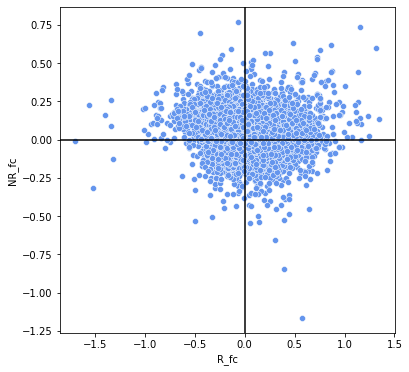

In [31]:
# foldchange
plt.figure(figsize=(6, 6))
sns.scatterplot(x='R_fc', y='NR_fc', data=merged_deg_91061, color='cornflowerblue')
plt.axvline(x=0., c='k')
plt.axhline(y=0., c='k')

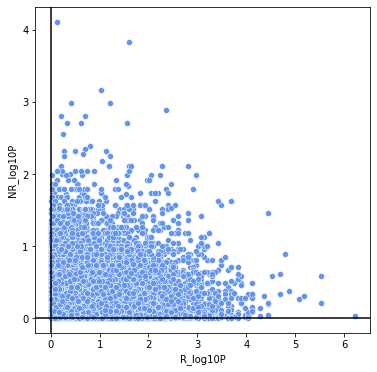

In [32]:
# p values
plt.figure(figsize=(6, 6))
sns.scatterplot(x='R_log10P', y='NR_log10P', data=merged_deg_91061, color='cornflowerblue')
plt.axvline(x=0., c='k')
plt.axhline(y=0., c='k')

In [33]:
print(response_signature_91061['NR'][response_signature_91061['NR']['log10P'] >= 1.].shape)
print(response_signature_91061['R'][response_signature_91061['R']['log10P'] >= 1.].shape)

print(response_signature_91061['NR'][response_signature_91061['NR']['log10P'] >= -np.log10(0.05)].shape)
print(response_signature_91061['R'][response_signature_91061['R']['log10P'] >= -np.log10(0.05)].shape)

print(response_signature_91061['NR'][response_signature_91061['NR']['log2FC(P-N)'] >= .5].shape)
print(response_signature_91061['R'][response_signature_91061['R']['log2FC(P-N)'] >= .5].shape)

(720, 4)
(3398, 4)
(314, 4)
(2545, 4)
(18, 4)
(349, 4)


In [34]:
# take the wilcoxon p < 0.05 as primary signature
pri_sig_91061_NR = response_signature_91061['NR'][response_signature_91061['NR']['log10P'] >= -np.log10(0.05)]
pri_sig_91061_R = response_signature_91061['R'][response_signature_91061['R']['log10P'] >= -np.log10(0.05)]

pri_sig_91061_NR = df(np.sign(pri_sig_91061_NR['log2FC(P-N)']) * 1)
pri_sig_91061_R = df(np.sign(pri_sig_91061_R['log2FC(P-N)']) * 1)

In [35]:
pri_sig_91061_merged = pd.concat([pri_sig_91061_NR.rename(columns={'log2FC(P-N)': 'NR'})['NR'], pri_sig_91061_R.rename(columns={'log2FC(P-N)': 'R'})['R']], axis=1)

In [36]:
pri_sig_91061_merged = pri_sig_91061_merged.fillna(0)

NR  -1     0    1
R                
-1   3  1741   74
 0  41     0  188
 1   3   719    5


NR,-1,0,1
R,,,
-1,3,1741,74
0,41,0,188
1,3,719,5


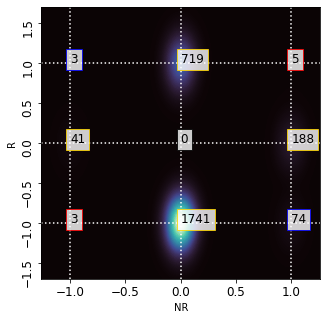

In [37]:
nebularplot(sig1=pri_sig_91061_merged['NR'],
            sig2=pri_sig_91061_merged['R'],
            save_path=None, drop_zero='off')

## 4.1 synergy evaluationon pri-signature

In [38]:
# output of the generalized synergy evaluation
se_pri_91061_skcm_cp = df(index=skcm_trt_cp.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in skcm_trt_cp.columns:
    tmp_pert = df(skcm_trt_cp[pert]).groupby(level=0).mean()
    tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
    tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(pri_sig_91061_merged['R']), sigR=df(pri_sig_91061_merged['NR']))

    se_pri_91061_skcm_cp.at[pert, 'reverse_term'] = tmp_result[0]
    se_pri_91061_skcm_cp.at[pert, 'promoting_term'] = tmp_result[1]
    se_pri_91061_skcm_cp.at[pert, 'direction_merged'] = tmp_result[2]
    se_pri_91061_skcm_cp.at[pert, 'direction_d'] = tmp_result[3]
    se_pri_91061_skcm_cp.at[pert, 'direction_t'] = tmp_result[4]
    se_pri_91061_skcm_cp.at[pert, 'orth_term'] = tmp_result[5]
    se_pri_91061_skcm_cp.at[pert, 'orth_term_r'] = tmp_result[6]

se_pri_91061_skcm_cp = se_pri_91061_skcm_cp.dropna(axis=0, how='any')

In [39]:
# output of the generalized synergy evaluation
se_pri_91061_skcm_sh = df(index=skcm_trt_sh.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in skcm_trt_sh.columns:
    tmp_pert = df(skcm_trt_sh[pert]).groupby(level=0).mean()
    tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
    tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(pri_sig_91061_merged['R']), sigR=df(pri_sig_91061_merged['NR']))

    se_pri_91061_skcm_sh.at[pert, 'reverse_term'] = tmp_result[0]
    se_pri_91061_skcm_sh.at[pert, 'promoting_term'] = tmp_result[1]
    se_pri_91061_skcm_sh.at[pert, 'direction_merged'] = tmp_result[2]
    se_pri_91061_skcm_sh.at[pert, 'direction_d'] = tmp_result[3]
    se_pri_91061_skcm_sh.at[pert, 'direction_t'] = tmp_result[4]
    se_pri_91061_skcm_sh.at[pert, 'orth_term'] = tmp_result[5]
    se_pri_91061_skcm_sh.at[pert, 'orth_term_r'] = tmp_result[6]

se_pri_91061_skcm_sh = se_pri_91061_skcm_sh.dropna(axis=0, how='any')

In [40]:
# output of the generalized synergy evaluation
se_pri_91061_jurkat = df(index=jurkat_lv5_sig.columns, columns=['reverse_term', 'promoting_term', 'direction_merged', 'direction_t', 'direction_d', 'orth_term', 'orth_term_r'])

for pert in jurkat_lv5_sig.columns:
    if pert not in ['disease_sig', 'reference_sig']:
        tmp_pert = df(jurkat_lv5_sig[pert]).groupby(level=0).mean()
        tmp_pert = tmp_pert[tmp_pert != 0].dropna(axis=0, how='any')
        tmp_result = generalized_synergy(sigD1=tmp_pert, sigD2=df(pri_sig_91061_merged['R']), sigR=df(pri_sig_91061_merged['NR']))

        se_pri_91061_jurkat.at[pert, 'reverse_term'] = tmp_result[0]
        se_pri_91061_jurkat.at[pert, 'promoting_term'] = tmp_result[1]
        se_pri_91061_jurkat.at[pert, 'direction_merged'] = tmp_result[2]
        se_pri_91061_jurkat.at[pert, 'direction_d'] = tmp_result[3]
        se_pri_91061_jurkat.at[pert, 'direction_t'] = tmp_result[4]
        se_pri_91061_jurkat.at[pert, 'orth_term'] = tmp_result[5]
        se_pri_91061_jurkat.at[pert, 'orth_term_r'] = tmp_result[6]

se_pri_91061_jurkat = se_pri_91061_jurkat.dropna(axis=0, how='any')

In [41]:
# add synergy evaluation
se_pri_91061_skcm_sh['synergy_score'] = se_pri_91061_skcm_sh['reverse_term'] / (1 - se_pri_91061_skcm_sh['orth_term']) * se_pri_91061_skcm_sh['direction_d']
se_pri_91061_skcm_cp['synergy_score'] = se_pri_91061_skcm_cp['reverse_term'] / (1 - se_pri_91061_skcm_cp['orth_term']) * se_pri_91061_skcm_cp['direction_d']
se_pri_91061_jurkat['synergy_score'] = se_pri_91061_jurkat['reverse_term'] / (1 - se_pri_91061_jurkat['orth_term']) * se_pri_91061_jurkat['direction_d']

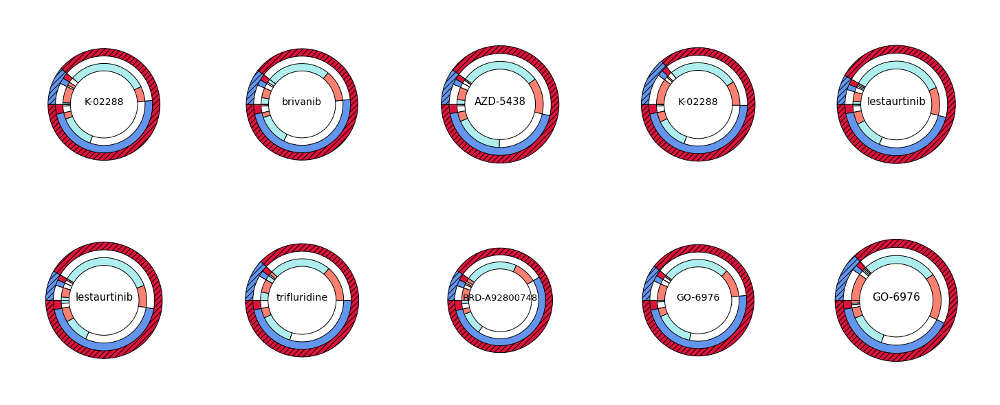

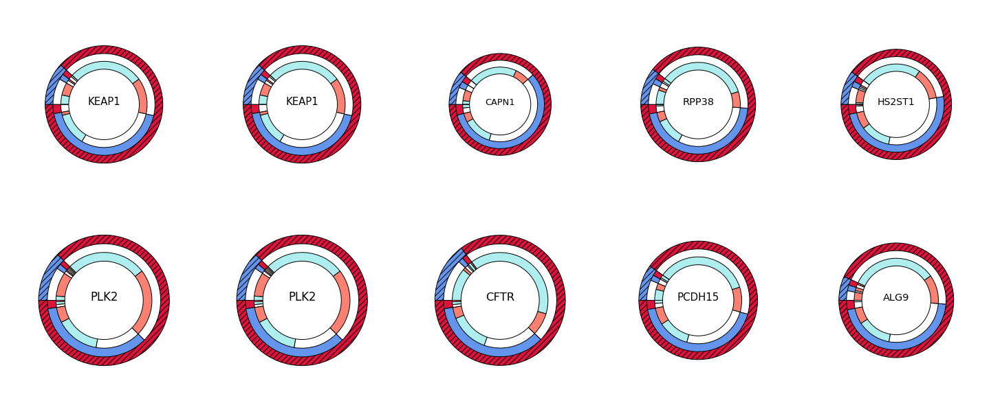

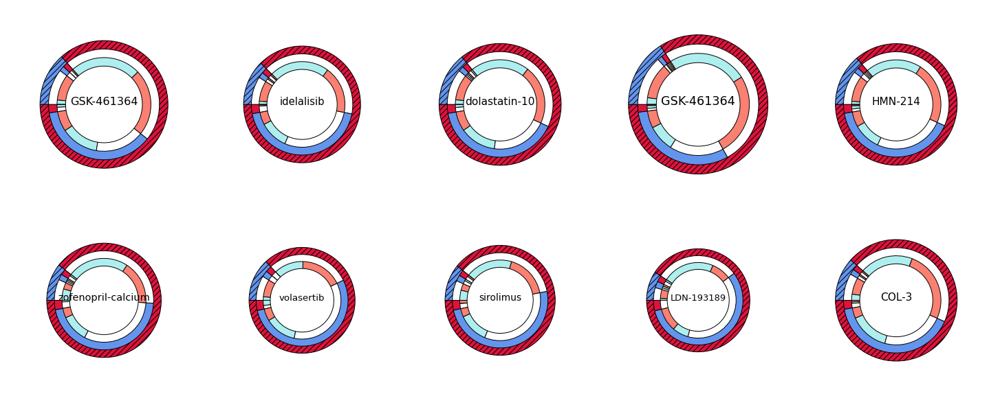

In [42]:
ring_matrix_plot(measurement='synergy_score',
                 compound_info=skcm_sig_info,
                 synergy_result=se_pri_91061_skcm_cp,
                 resistance_signature=df(pri_sig_91061_merged['NR']),
                 response_signature=df(pri_sig_91061_merged['R']),
                 drug_signature=skcm_trt_cp,
                 plot_kwargs={'ring_size': 3, 'ring_width': 0.4, 'ft_size': 60},
                 save_path=None)

ring_matrix_plot(measurement='synergy_score',
                 compound_info=skcm_sig_info,
                 synergy_result=se_pri_91061_skcm_sh,
                 resistance_signature=df(pri_sig_91061_merged['NR']),
                 response_signature=df(pri_sig_91061_merged['R']),
                 drug_signature=skcm_trt_sh,
                 plot_kwargs={'ring_size': 3, 'ring_width': 0.4, 'ft_size': 60},
                 save_path=None)

ring_matrix_plot(measurement='synergy_score',
                 compound_info=jurkat_lv5_sig_info,
                 synergy_result=se_pri_91061_jurkat,
                 resistance_signature=df(pri_sig_91061_merged['NR']),
                 response_signature=df(pri_sig_91061_merged['R']),
                 drug_signature=jurkat_lv5_sig,
                 plot_kwargs={'ring_size': 3, 'ring_width': 0.4, 'ft_size': 60},
                 save_path=None)

In [43]:
# top results: compounds
top_cp = se_pri_91061_skcm_cp.sort_values(by='synergy_score', ascending=False).rename(index=skcm_sig_info['cmap_name'])[:50]
top_cp

,reverse_term,promoting_term,direction_merged,direction_t,direction_d,orth_term,orth_term_r,synergy_score
K-02288,0.168603,0.022859,0.145743,0.077186,0.068557,0.64248,-1.414013,0.032331
brivanib,0.155993,0.040604,0.11539,0.077186,0.038204,0.784106,-1.404459,0.027604
AZD-5438,0.176748,0.040466,0.136281,0.077186,0.059095,0.616162,-1.522293,0.027212
K-02288,0.161797,0.028565,0.133232,0.077186,0.056045,0.619577,-1.863057,0.023837
lestaurtinib,0.177818,0.039163,0.138655,0.077186,0.061469,0.490909,-1.452229,0.02147
lestaurtinib,0.176561,0.035545,0.141016,0.077186,0.06383,0.457105,-1.375796,0.020759
trifluridine,0.147157,0.041671,0.105486,0.077186,0.0283,0.798303,-2.378981,0.020647
BRD-A92800748,0.152011,0.028113,0.123898,0.077186,0.046711,0.645503,-0.805732,0.02003
GO-6976,0.164258,0.031564,0.132695,0.077186,0.055508,0.521625,-1.429936,0.01906
GO-6976,0.173321,0.046977,0.126344,0.077186,0.049158,0.551724,-1.955414,0.019006


In [44]:
# top results: JURKAT
top_jurkat = se_pri_91061_jurkat.sort_values(by='synergy_score', ascending=False).rename(index=jurkat_lv5_sig_info['cmap_name'])[:50]
top_jurkat

,reverse_term,promoting_term,direction_merged,direction_t,direction_d,orth_term,orth_term_r,synergy_score
GSK-461364,0.161315,0.058285,0.103029,0.077186,0.025843,0.594281,-3.121019,0.010275
idelalisib,0.15082,0.046302,0.104518,0.077186,0.027331,0.538941,-2.066879,0.00894
dolastatin-10,0.158205,0.058443,0.099762,0.077186,0.022576,0.597235,-2.455414,0.008868
GSK-461364,0.168049,0.069462,0.098587,0.077186,0.021401,0.568871,-3.624204,0.008342
HMN-214,0.150169,0.055907,0.094262,0.077186,0.017076,0.616883,-2.433121,0.006693
zofenopril-calcium,0.140497,0.046378,0.094119,0.077186,0.016932,0.635774,-2.436306,0.006532
volasertib,0.137483,0.044251,0.093232,0.077186,0.016046,0.660027,-1.398089,0.006489
sirolimus,0.140324,0.05145,0.088874,0.077186,0.011688,0.736196,-1.595541,0.006217
LDN-193189,0.148407,0.047161,0.101246,0.077186,0.024059,0.422803,-0.340764,0.006186
COL-3,0.153918,0.062272,0.091647,0.077186,0.01446,0.638258,-2.363057,0.006153


In [45]:
# overlap compounds in jurkat and melanoma cell lines
top_op_cp = list(set(top_cp.index) & set(top_jurkat.index))
print(top_op_cp)

['sirolimus']


In [46]:
# top results: shRNAs
se_pri_91061_skcm_sh.sort_values(by='synergy_score', ascending=False).rename(index=skcm_sig_info['cmap_name'])[:50]

,reverse_term,promoting_term,direction_merged,direction_t,direction_d,orth_term,orth_term_r,synergy_score
KEAP1,0.168016,0.042541,0.125475,0.077186,0.048289,0.594366,-1.261146,0.020001
KEAP1,0.168016,0.042541,0.125475,0.077186,0.048289,0.594366,-1.261146,0.020001
CAPN1,0.15046,0.027868,0.122592,0.077186,0.045405,0.625731,-0.633758,0.018253
RPP38,0.16767,0.037916,0.129755,0.077186,0.052569,0.50077,-1.066879,0.017656
HS2ST1,0.149685,0.040724,0.108961,0.077186,0.031775,0.727694,-1.748408,0.017466
PLK2,0.170037,0.058213,0.111825,0.077186,0.034638,0.660266,-3.312102,0.017337
PLK2,0.170037,0.058213,0.111825,0.077186,0.034638,0.660266,-3.312102,0.017337
CFTR,0.177056,0.048923,0.128133,0.077186,0.050947,0.417852,-3.031847,0.015495
PCDH15,0.169494,0.043443,0.126052,0.077186,0.048866,0.41924,-1.681529,0.014261
ALG9,0.167673,0.036128,0.131544,0.077186,0.054358,0.345277,-1.933121,0.013921


(35, 86)


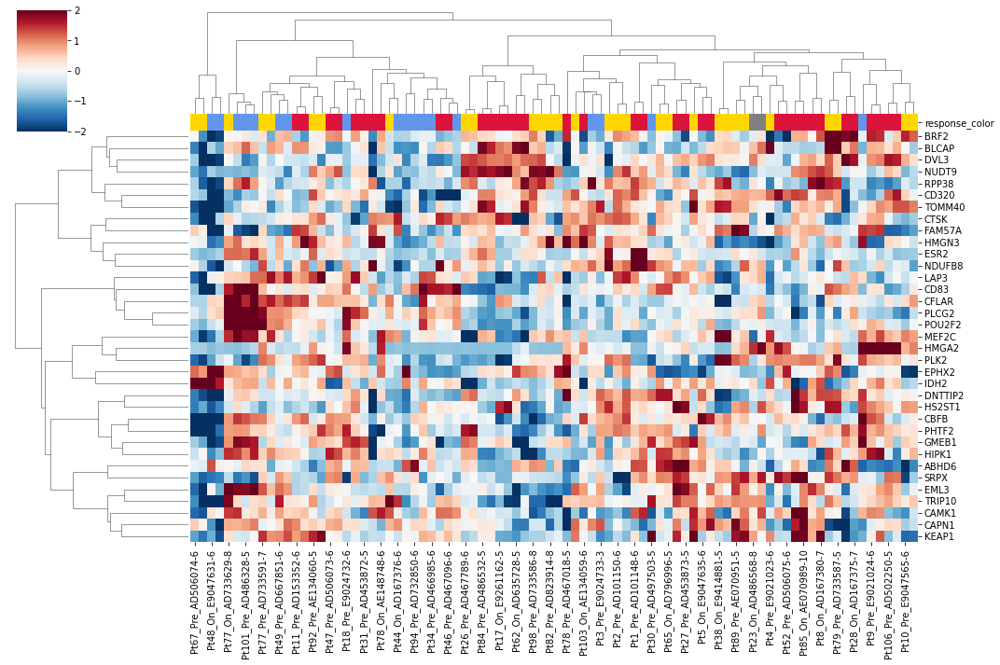

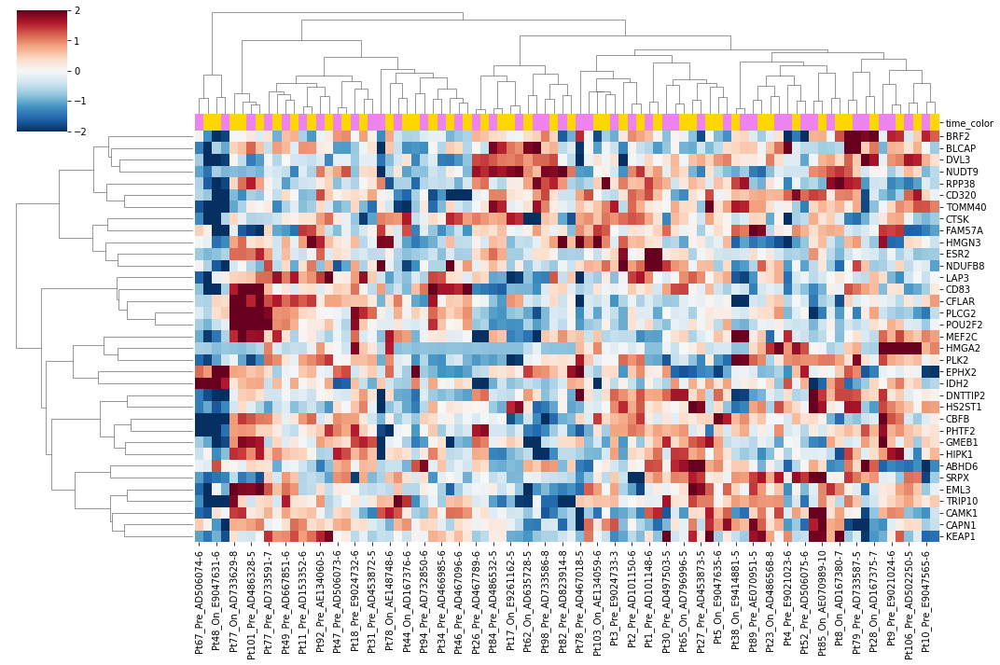

In [47]:
# expression of top target genes in patients
top_pri_91061_skcm_sh = se_pri_91061_skcm_sh.sort_values(by='synergy_score', ascending=False).rename(index=skcm_sig_info['cmap_name'])[:50].index

tmp_sub = log2exp2_91061[log2exp2_91061.index.isin(top_pri_91061_skcm_sh)][patient_color.index]
print(tmp_sub.shape)


sns.clustermap(tmp_sub,
               figsize=(15, 10),
               cmap='RdBu_r',
               z_score=0,
               vmin=-2,
               vmax=2,
               method='ward',
               col_colors=patient_color['response_color'])
plt.show()
sns.clustermap(tmp_sub,
               figsize=(15, 10),
               cmap='RdBu_r',
               z_score=0,
               vmin=-2,
               vmax=2,
               method='ward',
               col_colors=patient_color['time_color'])
plt.show()

## 4.2 Basic statistics for the original expression matrix

### 4.2.1 Different time points related to ICB response

In [30]:
log2exp2_91061

,Pt1_Pre_AD101148-6,Pt1_On_AD174047-6,Pt10_Pre_E9047565-6,Pt10_On_E9047632-6,Pt101_Pre_AD486328-5,Pt101_On_AD681975-5,Pt103_Pre_AE134058-2,Pt103_On_AE134059-6,Pt105_On_AE373241-6,Pt106_Pre_AD502250-5,...,Pt9_Pre_E9021024-6,Pt9_On_E9047644-7,Pt90_Pre_AD467873-6,Pt92_Pre_AE134060-5,Pt92_On_AE148750-5,Pt93_On_AE070988-5,Pt94_Pre_AD732850-6,Pt94_On_AE373242-6,Pt98_Pre_AD733586-8,Pt98_On_AE086717-6
A2M,7.582236,7.167698,6.082596,7.827324,5.663018,6.801615,6.985822,6.843641,10.145518,8.130359,...,7.006278,6.533178,6.210327,8.888489,9.526157,6.350599,6.898988,8.360750,8.614040,9.366197
A4GALT,0.822107,0.426160,0.386464,1.079473,2.235581,2.444326,3.244868,1.874906,1.327251,1.969079,...,2.815122,2.918962,1.442517,1.527578,1.660082,2.600681,2.718031,1.778107,0.161170,0.336551
AAAS,4.260058,4.452672,4.533336,4.376626,4.528312,4.608623,4.590702,4.972396,4.229537,4.848491,...,4.914140,4.996882,4.209373,5.044536,4.371342,5.227479,4.753709,4.398732,4.817364,4.655765
AACS,2.966406,3.527400,2.038837,2.095866,2.352609,2.495744,2.211618,2.477849,2.254975,2.135520,...,3.003886,3.124374,2.281241,2.365595,1.523037,2.966086,2.066336,1.553460,2.413818,2.225383
AADAC,0.000000,0.000000,0.014000,0.000000,0.000000,0.000000,1.119921,0.604064,0.217109,0.000000,...,0.000000,0.000000,0.000000,0.080123,0.000000,0.000000,0.417766,6.882666,0.095204,0.283142
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZWINT,5.309225,5.632313,3.940326,3.729819,4.142810,4.067501,3.458396,4.249795,3.191878,4.632278,...,3.989329,4.197896,3.355992,4.423034,4.355485,5.446090,3.244876,2.764556,3.647557,3.493795
ZXDC,2.465684,2.672717,2.168978,2.214377,2.235516,2.578422,1.239695,2.157151,2.046397,2.171659,...,2.806597,2.769769,2.249545,2.180662,1.576542,2.716621,1.851063,1.741804,2.186003,2.233482
ZYX,5.085002,4.389900,4.511471,5.358392,6.261434,6.369485,6.443684,5.742093,5.652566,5.872307,...,6.176520,6.219672,5.868941,5.787585,5.728853,5.060803,5.333168,5.034388,5.141265,4.977189
ZZEF1,2.316134,2.162417,2.321167,2.469824,3.145619,3.452226,1.343173,2.557186,2.717703,2.672646,...,2.898248,2.767597,2.236606,2.526539,2.403111,2.581139,3.367027,3.267513,2.838585,3.048642


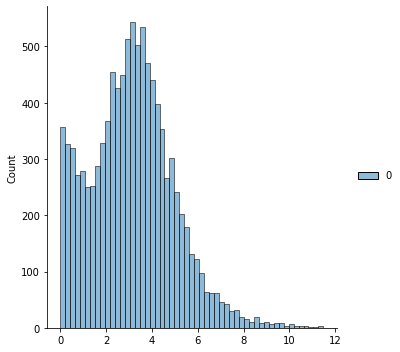

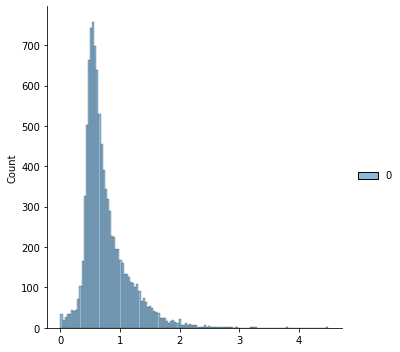

5998


In [31]:
# exclude low variance and low expr genes
log2exp2_91061_mean = df(log2exp2_91061.mean(axis=1))
log2exp2_91061_std = df(log2exp2_91061.std(axis=1))

sns.displot(log2exp2_91061_mean)
plt.show()

sns.displot(log2exp2_91061_std)
plt.show()

# mean > 2, std > .5
top_genes_mean = log2exp2_91061_mean[log2exp2_91061_mean[0] >= 2]
top_genes_std = log2exp2_91061_std[log2exp2_91061_std[0] >= 0.5]

top_genes = list(set(top_genes_mean.index) & set(top_genes_std.index))
print(len(top_genes))

In [32]:
log2exp2_91061_top = log2exp2_91061[log2exp2_91061.index.isin(top_genes)]

In [33]:
paired_91061

,Pre,On,response,response_color
Pt1,Pt1_Pre_AD101148-6,Pt1_On_AD174047-6,PD,crimson
Pt2,Pt2_Pre_AD101150-6,Pt2_On_AD174046-6,SD,royalblue
Pt23,Pt23_Pre_AD313075-5,Pt23_On_AD486568-8,UNK,grey
Pt82,Pt82_Pre_AD823914-8,Pt82_On_AD125218-6,SD,royalblue
Pt49,Pt49_Pre_AD667851-6,Pt49_On_AD681976-5,PRCR,cornflowerblue
Pt85,Pt85_Pre_AD486329-5,Pt85_On_AE070989-10,PD,crimson
Pt89,Pt89_Pre_AE070951-5,Pt89_On_AE070987-5,SD,royalblue
Pt101,Pt101_Pre_AD486328-5,Pt101_On_AD681975-5,PRCR,cornflowerblue
Pt47,Pt47_Pre_AD506073-6,Pt47_On_AD530367-6,PD,crimson
Pt52,Pt52_Pre_AD506075-6,Pt52_On_AD530365-6,PD,crimson


C:\Users\ywang\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


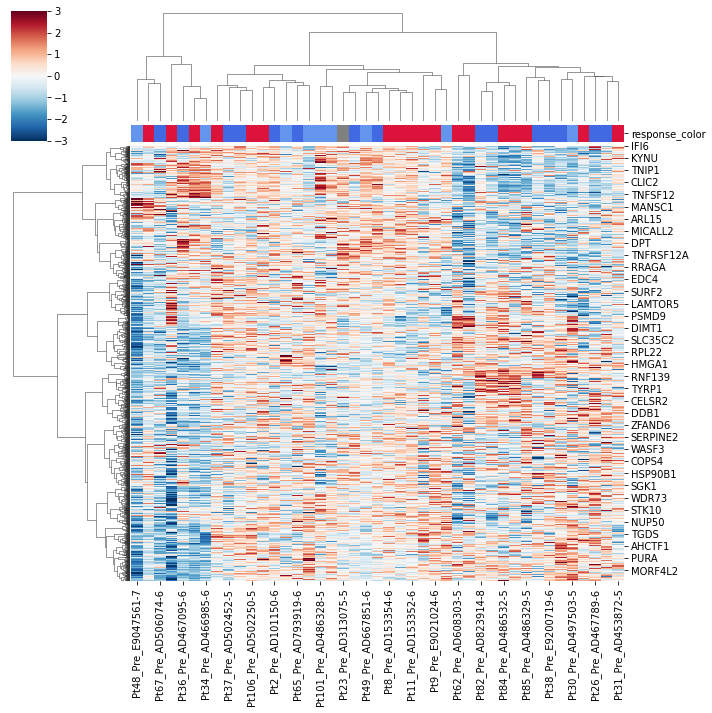

In [34]:
# differential between N and NR in pre-treatment
sns.clustermap(log2exp2_91061_top[paired_91061['Pre']],
               figsize=(10, 10),
               cmap='RdBu_r',
               z_score=0,
               vmin=-3,
               vmax=3,
               method='ward',
               col_colors=patient_color['response_color'])
plt.show()

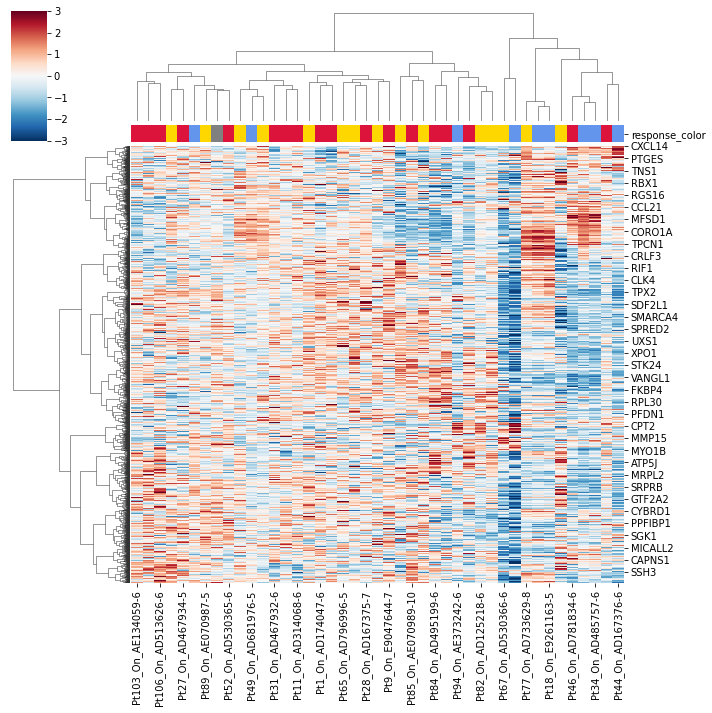

In [53]:
# differential between N and NR in on-treatment
sns.clustermap(log2exp2_91061_top[paired_91061['On']],
               figsize=(10, 10),
               cmap='RdBu_r',
               z_score=0,
               vmin=-3,
               vmax=3,
               method='ward',
               col_colors=patient_color['response_color'])
plt.show()

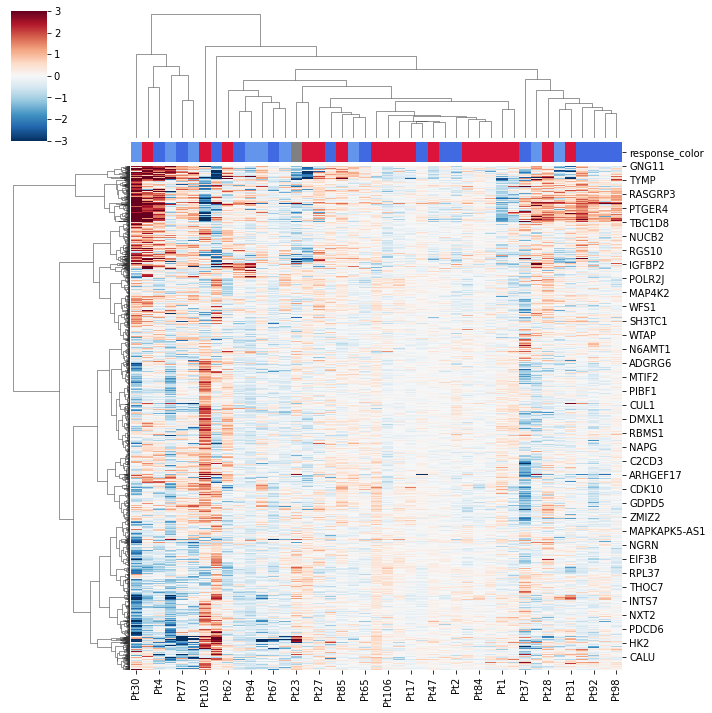

In [37]:
# differential between N and NR in On-treatment - Pre-treatment
log2exp2_91061_top_fc = df(index=log2exp2_91061_top.index, columns=paired_91061.index)
for p in log2exp2_91061_top_fc.columns:
    log2exp2_91061_top_fc[p] = log2exp2_91061_top[paired_91061.loc[p, 'On']] - log2exp2_91061_top[paired_91061.loc[p, 'Pre']]

sns.clustermap(log2exp2_91061_top_fc,
               figsize=(10, 10),
               cmap='RdBu_r',
               z_score=None,
               vmin=-3,
               vmax=3,
               method='ward',
               col_colors=paired_91061['response_color'])
plt.show()

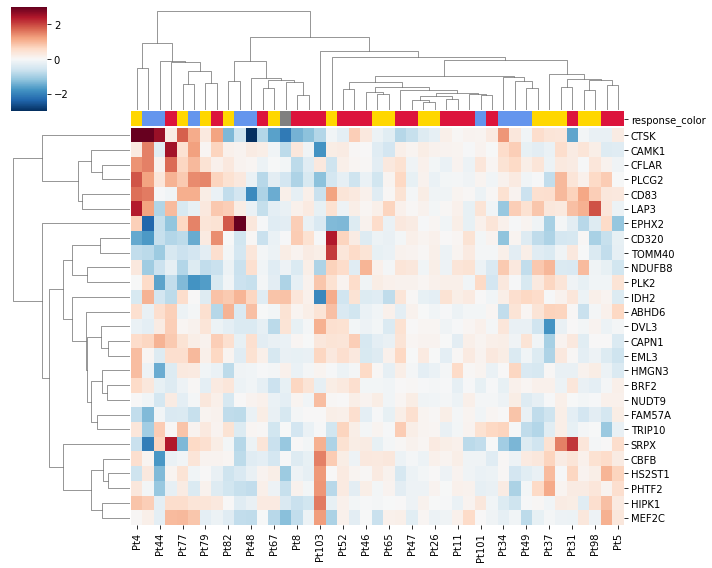

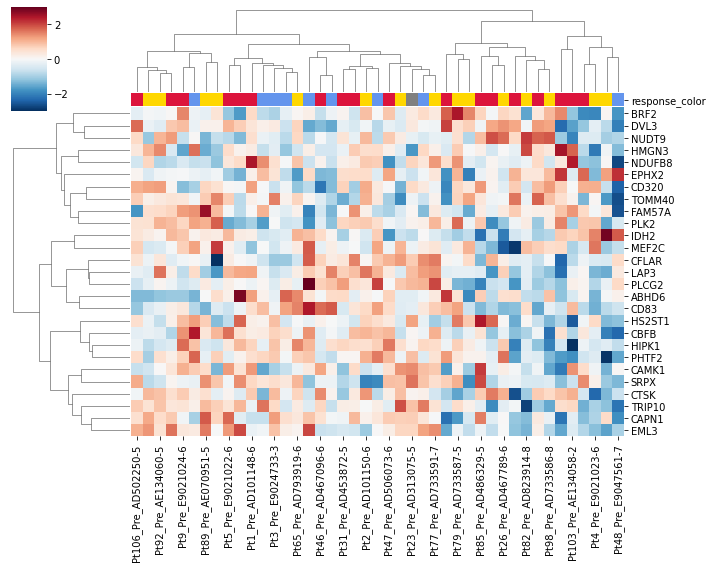

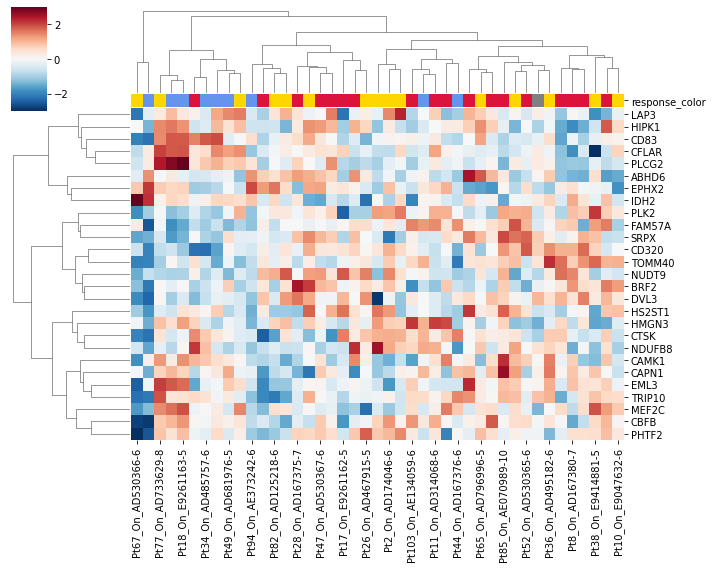

In [55]:
# top shRNAs
sns.clustermap(log2exp2_91061_top_fc[log2exp2_91061_top_fc.index.isin(top_pri_91061_skcm_sh)],
               figsize=(10, 8),
               cmap='RdBu_r',
               z_score=None,
               vmin=-3,
               vmax=3,
               method='ward',
               col_colors=paired_91061['response_color'])
plt.show()

sns.clustermap(log2exp2_91061_top[log2exp2_91061_top.index.isin(top_pri_91061_skcm_sh)][paired_91061['Pre']],
               figsize=(10, 8),
               cmap='RdBu_r',
               z_score=0,
               vmin=-3,
               vmax=3,
               method='ward',
               col_colors=patient_color['response_color'])
plt.show()

sns.clustermap(log2exp2_91061_top[log2exp2_91061_top.index.isin(top_pri_91061_skcm_sh)][paired_91061['On']],
               figsize=(10, 8),
               cmap='RdBu_r',
               z_score=0,
               vmin=-3,
               vmax=3,
               method='ward',
               col_colors=patient_color['response_color'])
plt.show()

In [35]:
# compare two conditions, non-paired
def deg_wo_paired(l_post, l_pre):
    '''
    Compare through differentially expressed genes.
    l_post, l_pre: dataframe, expression matrix in selected gene space
    '''
    # DEGs in landmark space
    ranksum_landmark = df(columns=['log2FC(P-N)', 'ranksum_stat', 'ranksum_p'])
    for g in l_post.index:
        tmp_post = l_post.loc[g, :]
        tmp_pre = l_pre.loc[g, :]
        ranksum_landmark.at[g, 'log2FC(P-N)'] = tmp_post.mean() - tmp_pre.mean()
        ranksum_landmark.at[g, 'ranksum_stat'], ranksum_landmark.at[g, 'ranksum_p'] = stats.ranksums(tmp_post, tmp_pre)

    return ranksum_landmark

In [38]:
# compare NR and R in pre-treatment and on-treatment, without paired
deg_91061 = {}

tmp_NR_pre = paired_91061[paired_91061['response'].isin(['PD'])]['Pre']
tmp_R_pre = paired_91061[paired_91061['response'].isin(['PRCR', 'SD'])]['Pre']
deg_91061['pre'] = deg_wo_paired(l_post=log2exp2_91061[tmp_NR_pre],
                                                        l_pre=log2exp2_91061[tmp_R_pre])

tmp_NR_on = paired_91061[paired_91061['response'].isin(['PD'])]['On']
tmp_R_on = paired_91061[paired_91061['response'].isin(['PRCR', 'SD'])]['On']
deg_91061['on'] = deg_wo_paired(l_post=log2exp2_91061[tmp_NR_on],
                                                        l_pre=log2exp2_91061[tmp_R_on])

tmp_NR_pre = list(paired_91061[paired_91061['response'].isin(['PD'])]['Pre'])
tmp_NR_post = list(paired_91061[paired_91061['response'].isin(['PD'])]['On'])
deg_91061['NR'] = deg_wo_paired(l_post=log2exp2_91061[tmp_NR_post],
                                                        l_pre=log2exp2_91061[tmp_NR_pre])

tmp_R_pre = list(paired_91061[paired_91061['response'].isin(['SD', 'PRCR'])]['Pre'])
tmp_R_post = list(paired_91061[paired_91061['response'].isin(['SD', 'PRCR'])]['On'])
deg_91061['R'] = deg_wo_paired(l_post=log2exp2_91061[tmp_R_post],
                                                        l_pre=log2exp2_91061[tmp_R_pre])

tmp_fc_NR = list(paired_91061[paired_91061['response'].isin(['PD'])].index)
tmp_fc_R = list(paired_91061[paired_91061['response'].isin(['SD', 'PRCR'])].index)
deg_91061['fc'] = deg_wo_paired(l_post=log2exp2_91061_top_fc[tmp_fc_NR],
                                                        l_pre=log2exp2_91061_top_fc[tmp_fc_R])

In [39]:
deg_91061['pre']['log10P'] = -np.log10(deg_91061['pre']['ranksum_p'].astype(float))
deg_91061['on']['log10P'] = -np.log10(deg_91061['on']['ranksum_p'].astype(float))
deg_91061['NR']['log10P'] = -np.log10(deg_91061['NR']['ranksum_p'].astype(float))
deg_91061['R']['log10P'] = -np.log10(deg_91061['R']['ranksum_p'].astype(float))
deg_91061['fc']['log10P'] = -np.log10(deg_91061['fc']['ranksum_p'].astype(float))

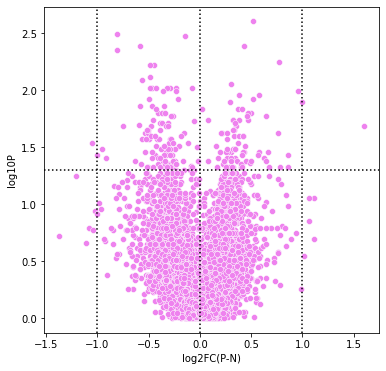

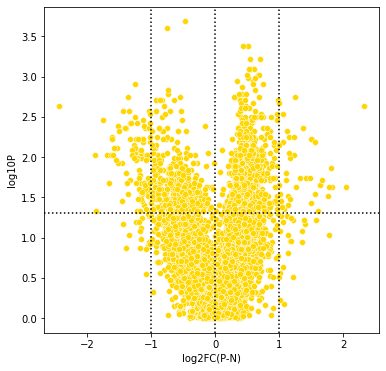

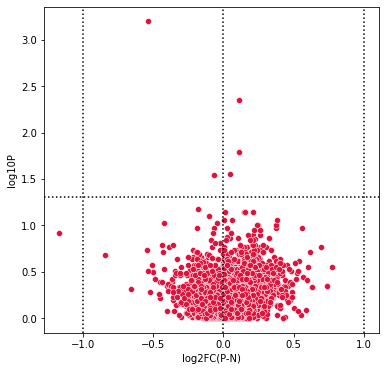

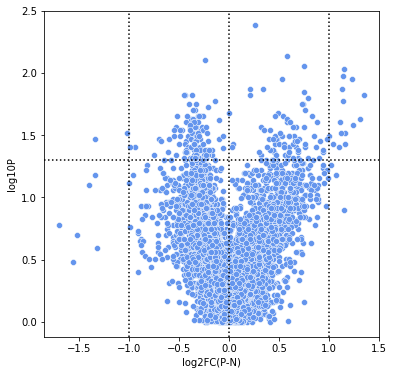

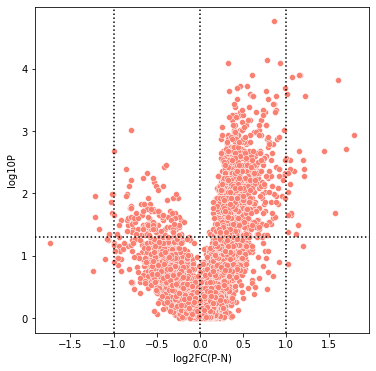

In [64]:
# volcano: pre
plt.figure(figsize=(6, 6))
sns.scatterplot(x='log2FC(P-N)', y='log10P', data=deg_91061['pre'], color='violet')
plt.axvline(x=0., ls=':', c='k')
plt.axvline(x=1., ls=':', c='k')
plt.axvline(x=-1, ls=':', c='k')
plt.axhline(y=-np.log10(0.05), ls=':', c='k')
plt.show()

# volcano: on
plt.figure(figsize=(6, 6))
sns.scatterplot(x='log2FC(P-N)', y='log10P', data=deg_91061['on'], color='gold')
plt.axvline(x=0., ls=':', c='k')
plt.axvline(x=1., ls=':', c='k')
plt.axvline(x=-1, ls=':', c='k')
plt.axhline(y=-np.log10(0.05), ls=':', c='k')
plt.show()

# volcano: NR
plt.figure(figsize=(6, 6))
sns.scatterplot(x='log2FC(P-N)', y='log10P', data=deg_91061['NR'], color='crimson')
plt.axvline(x=0., ls=':', c='k')
plt.axvline(x=1., ls=':', c='k')
plt.axvline(x=-1, ls=':', c='k')
plt.axhline(y=-np.log10(0.05), ls=':', c='k')
plt.show()

# volcano: R
plt.figure(figsize=(6, 6))
sns.scatterplot(x='log2FC(P-N)', y='log10P', data=deg_91061['R'], color='cornflowerblue')
plt.axvline(x=0., ls=':', c='k')
plt.axvline(x=1., ls=':', c='k')
plt.axvline(x=-1, ls=':', c='k')
plt.axhline(y=-np.log10(0.05), ls=':', c='k')
plt.show()

# volcano: FC
plt.figure(figsize=(6, 6))
sns.scatterplot(x='log2FC(P-N)', y='log10P', data=deg_91061['fc'], color='salmon')
plt.axvline(x=0., ls=':', c='k')
plt.axvline(x=1., ls=':', c='k')
plt.axvline(x=-1, ls=':', c='k')
plt.axhline(y=-np.log10(0.05), ls=':', c='k')
plt.show()

## 4.3 Focus on the Differential Changes (Post - Pre) that are related to ICB response

In [40]:
deg_91061['fc']

,log2FC(P-N),ranksum_stat,ranksum_p,log10P
A2M,-0.108075,-0.787909,0.43075,0.365775
AAAS,0.26155,2.084147,0.037147,1.430079
AACS,0.380061,2.922889,0.003468,2.459921
AAGAB,0.197753,1.829983,0.067253,1.172292
AAMDC,0.042494,0.609994,0.541866,0.266108
...,...,...,...,...
ZSCAN9,0.276723,1.042074,0.297378,0.526692
ZWILCH,0.454592,2.770391,0.005599,2.251897
ZWINT,0.348637,1.575819,0.115068,0.939047
ZYX,-0.13168,-0.71166,0.476675,0.321777


In [41]:
deg_91061['fc'].loc['EZH2', :]

log2FC(P-N)     0.442407
ranksum_stat    1.880816
ranksum_p       0.059997
log10P          1.221871
Name: EZH2, dtype: object

In [42]:
deg_91061['fc'].sort_values(by='ranksum_p', ascending=True)[:1505] # top 25% as ranksum p values

,log2FC(P-N),ranksum_stat,ranksum_p,log10P
TYRO3,0.860045,4.295376,0.000017,4.758461
TMCC2,0.777366,3.964963,0.000073,4.134260
NDRG3,0.321298,3.939546,0.000082,4.088119
ATP9A,0.933532,3.939546,0.000082,4.088119
FGD1,0.603369,3.837881,0.000124,3.906226
...,...,...,...,...
LANCL1,0.326546,1.880816,0.059997,1.221871
RAB3D,0.311826,1.880816,0.059997,1.221871
RNASET2,-0.563085,-1.880816,0.059997,1.221871
DENND5A,0.262095,1.880816,0.059997,1.221871


In [43]:
sig_defc_91061 = df(deg_91061['fc'].sort_values(by='ranksum_p', ascending=True)[:1505])

In [44]:
sig_defc_91061

,log2FC(P-N),ranksum_stat,ranksum_p,log10P
TYRO3,0.860045,4.295376,0.000017,4.758461
TMCC2,0.777366,3.964963,0.000073,4.134260
NDRG3,0.321298,3.939546,0.000082,4.088119
ATP9A,0.933532,3.939546,0.000082,4.088119
FGD1,0.603369,3.837881,0.000124,3.906226
...,...,...,...,...
LANCL1,0.326546,1.880816,0.059997,1.221871
RAB3D,0.311826,1.880816,0.059997,1.221871
RNASET2,-0.563085,-1.880816,0.059997,1.221871
DENND5A,0.262095,1.880816,0.059997,1.221871


In [45]:
sig_defc_91061[sig_defc_91061['log2FC(P-N)'] > 0][:20]

,log2FC(P-N),ranksum_stat,ranksum_p,log10P
TYRO3,0.860045,4.295376,0.000017,4.758461
TMCC2,0.777366,3.964963,0.000073,4.134260
NDRG3,0.321298,3.939546,0.000082,4.088119
ATP9A,0.933532,3.939546,0.000082,4.088119
FGD1,0.603369,3.837881,0.000124,3.906226
HAS2,1.160649,3.837881,0.000124,3.906226
SLC6A8,1.15057,3.837881,0.000124,3.906226
TUBB4A,1.071359,3.812464,0.000138,3.861419
SOX10,1.598983,3.787048,0.000152,3.816879
BBS9,0.466022,3.736215,0.000187,3.728598


In [46]:
sig_defc_91061[sig_defc_91061['log2FC(P-N)'] < 0][:20]

,log2FC(P-N),ranksum_stat,ranksum_p,log10P
ID2,-0.800392,-3.304136,0.000953,3.021045
MT1E,-0.990581,-3.075388,0.002102,2.677307
MYD88,-0.389419,-2.922889,0.003468,2.459921
ACYP2,-0.421245,-2.897473,0.003762,2.424602
DHRS3,-0.851134,-2.872056,0.004078,2.389542
MYO1F,-0.610622,-2.821224,0.004784,2.320201
PSMB10,-0.662062,-2.770391,0.005599,2.251897
DPYD,-0.547394,-2.770391,0.005599,2.251897
METTL7A,-0.798596,-2.744974,0.006052,2.218132
APBB1IP,-0.525931,-2.719558,0.006537,2.184626


In [47]:
# establish sig_up and sig_down regarding to non-responders
sig_defc_91061_up = list(sig_defc_91061[sig_defc_91061['log2FC(P-N)'] > 0].index)
sig_defc_91061_down = list(sig_defc_91061[sig_defc_91061['log2FC(P-N)'] < 0].index)
print(len(sig_defc_91061_up), len(sig_defc_91061_down))

1331 174


In [104]:
# enrichment test: up
enrichr_defc_91061_up = gp.enrichr(gene_list=sig_defc_91061_up,
                                   gene_sets=['MSigDB_Hallmark_2020', 'GO_Biological_Process_2021'],
                                   organism='Human',
                                   description='sig_defc_91061_up',
                                   outdir='GSEA/sig_defc_91061_up',
                                   cutoff=0.5)

# enrichment test: down
enrichr_defc_91061_down = gp.enrichr(gene_list=sig_defc_91061_down,
                                   gene_sets=['MSigDB_Hallmark_2020', 'GO_Biological_Process_2021'],
                                   organism='Human',
                                   description='sig_defc_91061_down',
                                   outdir='GSEA/sig_defc_91061_down',
                                   cutoff=0.5)

In [108]:
enrichr_defc_91061_up.results.head(20)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,E2F Targets,80/200,5.471727e-42,2.735864e-40,0,0,9.884892,939.153511,TOP2A;MCM7;DSCC1;CSE1L;BUB1B;HMGB3;BRCA1;IPO7;...
1,MSigDB_Hallmark_2020,Myc Targets V1,78/200,5.164833e-40,1.291208e-38,0,0,9.463622,856.093711,YWHAE;SLC25A3;HSP90AB1;MCM7;PWP1;PHB2;RRP9;CDC...
2,MSigDB_Hallmark_2020,G2-M Checkpoint,68/200,1.035588e-30,1.725981e-29,0,0,7.560858,522.021165,TOP2A;CCNT1;CCNF;HMGB3;CDC20;CHAF1A;PTTG1;CCND...
3,MSigDB_Hallmark_2020,Myc Targets V2,32/58,6.274720e-23,7.843400e-22,0,0,17.663765,903.023392,NOLC1;TMEM97;PHB;WDR43;RRP9;SRM;TBRG4;HSPD1;UN...
4,MSigDB_Hallmark_2020,mTORC1 Signaling,57/200,1.241338e-21,1.241338e-20,0,0,5.796303,279.022976,GPI;PITPNB;CCNF;ATP2A2;TMEM97;ENO1;VLDLR;RRP9;...
5,MSigDB_Hallmark_2020,DNA Repair,37/150,2.101784e-12,1.751486e-11,0,0,4.695408,126.251242,POM121;FEN1;PCNA;CANT1;GTF3C5;RNMT;CETN2;USP11...
6,MSigDB_Hallmark_2020,Mitotic Spindle,41/199,6.711748e-11,4.794106e-10,0,0,3.723634,87.224540,TOP2A;YWHAE;PXN;TTK;WASL;ARHGAP5;KLC1;AURKA;AB...
7,MSigDB_Hallmark_2020,Glycolysis,37/200,1.247484e-08,7.796778e-08,0,0,3.246328,59.081715,TSTA3;PYGB;PRPS1;ABCB6;ENO1;VLDLR;PYGL;PLOD1;A...
8,MSigDB_Hallmark_2020,Estrogen Response Early,35/200,1.290064e-07,7.167023e-07,0,0,3.028620,48.044214,CANT1;ENDOD1;ISG20L2;CELSR2;TMEM164;AKAP1;IGF1...
9,MSigDB_Hallmark_2020,Oxidative Phosphorylation,33/200,1.164515e-06,5.822573e-06,0,0,2.816706,38.485229,GPI;SLC25A3;OAT;MGST3;MRPL15;MRPS30;PHB2;MRPL3...


In [109]:
enrichr_defc_91061_down.results.head(20)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,MSigDB_Hallmark_2020,Allograft Rejection,25/200,6.513476e-22,2.540256e-20,0,0,18.840844,919.112856,SPI1;CSF1;GPR65;NCF4;PRF1;WAS;CD3E;ITGAL;CD3D;...
1,MSigDB_Hallmark_2020,Interferon Gamma Response,21/200,5.714693e-17,1.114365e-15,0,0,15.065067,563.447170,CIITA;GCH1;C1S;C1R;GZMA;NMI;PSMB10;PARP12;VAMP...
2,MSigDB_Hallmark_2020,Complement,14/200,2.439257e-09,2.378276e-08,0,0,9.239247,183.228800,GCA;C1S;C1R;GZMA;WAS;DPP4;GZMK;CTSO;CASP7;LCK;...
3,MSigDB_Hallmark_2020,Inflammatory Response,14/200,2.439257e-09,2.378276e-08,0,0,9.239247,183.228800,ABCA1;SEMA4D;CD82;CSF1;GCH1;NMI;CXCR6;TNFRSF1B...
4,MSigDB_Hallmark_2020,Apoptosis,10/161,1.500357e-06,1.170278e-05,0,0,7.945001,106.540933,CD2;CASP7;CASP8;GCH1;DPYD;PRF1;CD14;CFLAR;BID;...
5,MSigDB_Hallmark_2020,Interferon Alpha Response,8/97,2.089568e-06,1.358219e-05,0,0,10.687424,139.776039,PROCR;CASP8;CSF1;C1S;DHX58;NMI;TRIM21;PARP12
6,MSigDB_Hallmark_2020,TNF-alpha Signaling via NF-kB,10/200,1.038750e-05,5.787319e-05,0,0,6.301669,72.311068,ABCA1;DRAM1;CSF1;GCH1;CEBPD;ID2;CCL5;CCL4;CFLA...
7,MSigDB_Hallmark_2020,Reactive Oxygen Species Pathway,4/49,8.640996e-04,4.212486e-03,0,0,10.343007,72.957732,HHEX;GLRX;LSP1;FTL
8,MSigDB_Hallmark_2020,IL-6/JAK/STAT3 Signaling,5/87,9.777912e-04,4.237095e-03,0,0,7.123683,49.368651,CSF1;IL10RB;CD14;TNFRSF1B;MYD88
9,MSigDB_Hallmark_2020,IL-2/STAT5 Signaling,7/199,1.821622e-03,7.104324e-03,0,0,4.286365,27.038510,CSF1;GPR65;IL2RB;IRF8;CD48;TNFRSF1B;DHRS3


### 4.3.1 shRNAs that targeting the genes in sig_defc_91061_up

In [ ]:
shRNA_skcm_target = list(skcm_sig_info.loc[skcm_trt_sh.columns, 'cmap_name'].unique())
print(len(shRNA_skcm_target))

In [ ]:
# number of shRNAs that can target genes in sig_defc_91061_up
shRNA_91061_target = list(set(shRNA_skcm_target) & set(sig_defc_91061_up))
print(len(shRNA_91061_target))

In [216]:
# show all the 239 target genes
print(shRNA_91061_target)

['BUB1B', 'DHPS', 'CDK19', 'CDC45', 'RPL7', 'ATP6V0A1', 'PLOD1', 'FADS1', 'PRKAR1A', 'ACBD3', 'VAT1', 'DVL2', 'ID2', 'TMEM5', 'RFC2', 'EPS8', 'SETDB1', 'TMEM97', 'TYRO3', 'PLXNA1', 'RHEB', 'BLM', 'FLI1', 'UBE2C', 'CANT1', 'TFAP2A', 'TARS', 'CCNB2', 'TYMS', 'TCEB3', 'PRPF6', 'ETV5', 'EXT1', 'FANCL', 'BAZ1B', 'BZW2', 'GMDS', 'FAM57A', 'IKZF1', 'HSPA4', 'UBE3A', 'BAG3', 'AIMP2', 'HSP90AB1', 'HSPA8', 'CRTAP', 'TTK', 'CHEK2', 'BLNK', 'COPS7A', 'BTG3', 'PHACTR1', 'PRAF2', 'LSP1', 'POLR3B', 'PLK1', 'PSMB5', 'ARNT2', 'LCK', 'MYC', 'MCM7', 'CREB3L2', 'AKAP1', 'BCL2', 'CALU', 'PIK3C3', 'FKBP1A', 'PSMB7', 'FBXO7', 'TXNRD1', 'RBBP7', 'CPNE3', 'POLD4', 'ATP5B', 'STXBP1', 'NPM1', 'MITF', 'SLC25A4', 'CTNNBIP1', 'MCM4', 'FBP1', 'TCEA1', 'IRF5', 'RUVBL2', 'BACE2', 'GLI3', 'BIRC5', 'CAND1', 'ZNF623', 'HAT1', 'LRRC16A', 'RPA2', 'FASTKD5', 'CRKL', 'DDB1', 'ICMT', 'RPN2', 'CLK4', 'CCDC86', 'PDHA1', 'BID', 'NNT', 'CD320', 'TP53BP1', 'POLR1C', 'UQCRC1', 'STMN1', 'AKTIP', 'GNA11', 'PRUNE', 'OXCT1', 'DLGAP5', 

In [55]:
# shRNA perturbations that targeting these genes should be able to inhibit the expression of sig_defc_91061_up
# enrichment of sig_defc_91061_up in shRNA signatures

## create rank list
skcm_trt_sh_original = pd.read_csv(data_home + '/CMAP2020_Cancer/SKCM/CMAP2020_lv5_trt_sh_merged.csv',
                                   header=0, index_col=0, sep=',')
skcm_trt_sh_original.index = skcm_trt_sh_original.index.astype(int)
skcm_trt_sh_original = skcm_trt_sh_original[skcm_trt_sh_original.index.isin(bing_landmark.index)].rename(index=bing_landmark['Official NCBI gene symbol'])

In [ ]:

skcm_trt_sh_91061 = skcm_trt_sh_original.T[skcm_trt_sh_original.columns.isin(skcm_sig_info[skcm_sig_info['cmap_name'].isin(shRNA_91061_target)].index)].T


# make pre-rank folders
if 'shRNA_91061_target' not in os.listdir(gsea_home + '/SKCM/'):
    os.mkdir(gsea_home + '/SKCM/shRNA_91061_target')

for p in skcm_trt_sh_91061.columns:
    tmp = df(skcm_trt_sh_91061[p]).sort_values(by=p, ascending=False)
    p_rename = '__'.join(p.split(':'))
    tmp.to_csv(gsea_home + '/SKCM/shRNA_91061_target/' + p_rename + '.rnk', header=None, sep='\t')

In [141]:
# create gene sets
with open(gsea_home + '/gene_sets/defc_91061.gmt', 'w') as f:
    tmp_up = ['differential_foldchange_NRvR_up', 'NRo-pVSRo-p']
    tmp_up.extend(sig_defc_91061_up)
    f.write('\t'.join(tmp_up))
    f.write('\n')
    tmp_down = ['differential_foldchange_NRvR_down', 'NRo-pVSRo-p']
    tmp_down.extend(sig_defc_91061_down)
    f.write('\t'.join(tmp_down))

In [164]:
# run pre-rank
prerank_shRNA_91061_nes = df(index=['differential_foldchange_NRvR_up', 'differential_foldchange_NRvR_down'], columns=skcm_trt_sh_91061.columns)
prerank_shRNA_91061_fdr = df(index=['differential_foldchange_NRvR_up', 'differential_foldchange_NRvR_down'], columns=skcm_trt_sh_91061.columns)
prerank_shRNA_91061_es = df(index=['differential_foldchange_NRvR_up', 'differential_foldchange_NRvR_down'], columns=skcm_trt_sh_91061.columns)

for p in skcm_trt_sh_91061.columns:
    p_rename = '__'.join(p.split(':'))
    rnk = pd.read_csv(gsea_home + '/SKCM/shRNA_91061_target/' + p_rename + '.rnk', header=None, sep="\t")
    pre_res = gp.prerank(rnk=rnk, gene_sets=gsea_home + '/gene_sets/defc_91061.gmt',
                         processes=1,
                         permutation_num=1000, # reduce number to speed up testing
                         outdir=None, format='png', seed=0, min_size=0, max_size=10000)
    prerank_shRNA_91061_nes[p] = pre_res.res2d['nes']
    prerank_shRNA_91061_fdr[p] = pre_res.res2d['fdr']
    prerank_shRNA_91061_es[p] = pre_res.res2d['es']

In [165]:
prerank_shRNA_91061_nes.T.sort_values(by='differential_foldchange_NRvR_up', ascending=True).rename(index=skcm_sig_info['cmap_name'])[:20]

,differential_foldchange_NRvR_up,differential_foldchange_NRvR_down
PHB,-2.527519,1.423671
CRKL,-2.509041,1.715495
MYC,-2.463158,0.876158
TPI1,-2.373167,1.472649
BAG6,-2.332912,1.329604
MYC,-2.309159,1.584719
RPL7,-2.306804,0.882697
HDAC2,-2.300180,0.968113
MCM3,-2.299147,1.027015
MCM7,-2.274950,2.184681


In [166]:
prerank_shRNA_91061_es.T.rename(index=skcm_sig_info['cmap_name']).loc['EZH2', :]

,differential_foldchange_NRvR_up,differential_foldchange_NRvR_down
EZH2,-0.295224,0.230662
EZH2,-0.319652,0.210315


In [178]:
prerank_shRNA_91061_es.T.sort_values(by='differential_foldchange_NRvR_up', ascending=True).rename(index=skcm_sig_info['cmap_name'])[:50]

,differential_foldchange_NRvR_up,differential_foldchange_NRvR_down
HDAC2,-0.382703,0.200247
MCM7,-0.381211,0.448169
MYC,-0.377414,0.186010
MCM3,-0.377150,0.219515
CRKL,-0.371990,0.341096
BAG6,-0.371430,0.285008
PHB,-0.370407,0.302542
MYC,-0.368126,0.319195
RPL7,-0.364337,0.216094
RPL7,-0.363006,0.194063


In [174]:
prerank_shRNA_91061_fdr.T.sort_values(by='differential_foldchange_NRvR_up', ascending=True).rename(index=skcm_sig_info['cmap_name'])[:50]

,differential_foldchange_NRvR_up,differential_foldchange_NRvR_down
PTK2,0.0,0.027563
FANCL,0.0,0.932584
RFC2,0.0,0.028321
PARN,0.0,0.841615
CCNB2,0.0,0.151899
BAG6,0.0,0.011655
BAG3,0.0,0.984488
CDK19,0.0,0.915695
NOLC1,0.0,0.058315
NOLC1,0.0,0.000000


In [180]:
prerank_shRNA_91061_fdr_result = prerank_shRNA_91061_fdr.T.copy()
prerank_shRNA_91061_fdr_result['cmap_name'] = skcm_sig_info['cmap_name']
prerank_shRNA_91061_fdr_result = prerank_shRNA_91061_fdr_result.sort_values(by='differential_foldchange_NRvR_up', ascending=True)

prerank_shRNA_91061_es_result = prerank_shRNA_91061_es.T.copy()
prerank_shRNA_91061_es_result['cmap_name'] = skcm_sig_info['cmap_name']
prerank_shRNA_91061_es_result = prerank_shRNA_91061_es_result.sort_values(by='differential_foldchange_NRvR_up', ascending=True)

prerank_shRNA_91061_nes_result = prerank_shRNA_91061_nes.T.copy()
prerank_shRNA_91061_nes_result['cmap_name'] = skcm_sig_info['cmap_name']
prerank_shRNA_91061_nes_result = prerank_shRNA_91061_nes_result.sort_values(by='differential_foldchange_NRvR_up', ascending=True)

prerank_shRNA_91061_es_result.to_csv(gsea_home + 'SKCM/shRNA_91061_target_results/es_sorted_by_sigup.csv', sep=',')
prerank_shRNA_91061_nes_result.to_csv(gsea_home + 'SKCM/shRNA_91061_target_results/nes_sorted_by_sigup.csv', sep=',')
prerank_shRNA_91061_fdr_result.to_csv(gsea_home + 'SKCM/shRNA_91061_target_results/fdr_sorted_by_sigup.csv', sep=',')

In [184]:
# selected cases: EZH2
for p in skcm_trt_sh_91061.columns:
    if skcm_sig_info.loc[p, 'cmap_name'] == 'EZH2':
        p_rename = '__'.join(p.split(':'))
        rnk = pd.read_csv(gsea_home + '/SKCM/shRNA_91061_target/' + p_rename + '.rnk', header=None, sep="\t")
        pre_res = gp.prerank(rnk=rnk, gene_sets=gsea_home + '/gene_sets/defc_91061.gmt',
                             processes=1,
                             permutation_num=1000, # reduce number to speed up testing
                             outdir=gsea_home + 'SKCM/shRNA_91061_target_selected/EZH2/' + p_rename,
                             format='png', seed=0, min_size=0, max_size=10000)

In [185]:
# selected cases: HDAC2
for p in skcm_trt_sh_91061.columns:
    if skcm_sig_info.loc[p, 'cmap_name'] == 'HDAC2':
        p_rename = '__'.join(p.split(':'))
        rnk = pd.read_csv(gsea_home + '/SKCM/shRNA_91061_target/' + p_rename + '.rnk', header=None, sep="\t")
        pre_res = gp.prerank(rnk=rnk, gene_sets=gsea_home + '/gene_sets/defc_91061.gmt',
                             processes=1,
                             permutation_num=1000, # reduce number to speed up testing
                             outdir=gsea_home + 'SKCM/shRNA_91061_target_selected/HDAC2/' + p_rename,
                             format='png', seed=0, min_size=0, max_size=10000)

In [186]:
# selected cases: PHB
for p in skcm_trt_sh_91061.columns:
    if skcm_sig_info.loc[p, 'cmap_name'] == 'PHB':
        p_rename = '__'.join(p.split(':'))
        rnk = pd.read_csv(gsea_home + '/SKCM/shRNA_91061_target/' + p_rename + '.rnk', header=None, sep="\t")
        pre_res = gp.prerank(rnk=rnk, gene_sets=gsea_home + '/gene_sets/defc_91061.gmt',
                             processes=1,
                             permutation_num=1000, # reduce number to speed up testing
                             outdir=gsea_home + 'SKCM/shRNA_91061_target_selected/PHB/' + p_rename,
                             format='png', seed=0, min_size=0, max_size=10000)

In [187]:
# selected cases: MYC
for p in skcm_trt_sh_91061.columns:
    if skcm_sig_info.loc[p, 'cmap_name'] == 'MYC':
        p_rename = '__'.join(p.split(':'))
        rnk = pd.read_csv(gsea_home + '/SKCM/shRNA_91061_target/' + p_rename + '.rnk', header=None, sep="\t")
        pre_res = gp.prerank(rnk=rnk, gene_sets=gsea_home + '/gene_sets/defc_91061.gmt',
                             processes=1,
                             permutation_num=1000, # reduce number to speed up testing
                             outdir=gsea_home + 'SKCM/shRNA_91061_target_selected/MYC/' + p_rename,
                             format='png', seed=0, min_size=0, max_size=10000)

In [188]:
# selected cases: BAG6
for p in skcm_trt_sh_91061.columns:
    if skcm_sig_info.loc[p, 'cmap_name'] == 'BAG6':
        p_rename = '__'.join(p.split(':'))
        rnk = pd.read_csv(gsea_home + '/SKCM/shRNA_91061_target/' + p_rename + '.rnk', header=None, sep="\t")
        pre_res = gp.prerank(rnk=rnk, gene_sets=gsea_home + '/gene_sets/defc_91061.gmt',
                             processes=1,
                             permutation_num=1000, # reduce number to speed up testing
                             outdir=gsea_home + 'SKCM/shRNA_91061_target_selected/BAG6/' + p_rename,
                             format='png', seed=0, min_size=0, max_size=10000)

### 4.3.2 Visualize the shRNA enrichment results

In [48]:
prerank_shRNA_91061_es_result = pd.read_csv(gsea_home + 'SKCM/shRNA_91061_target_results/es_sorted_by_sigup.csv',
                                            header=0, index_col=0, sep=',')

In [49]:
sig_fc_91061_color = df(index=sig_defc_91061.index, columns=['direction', 'color'])
for g in sig_fc_91061_color.index:
    if sig_defc_91061.loc[g, 'log2FC(P-N)'] > 0:
        sig_fc_91061_color.at[g, 'direction'] = 'NR_profile'
        sig_fc_91061_color.at[g, 'color'] = 'crimson'
    elif sig_defc_91061.loc[g, 'log2FC(P-N)'] < 0:
        sig_fc_91061_color.at[g, 'direction'] = 'R_profile'
        sig_fc_91061_color.at[g, 'color'] = 'cornflowerblue'

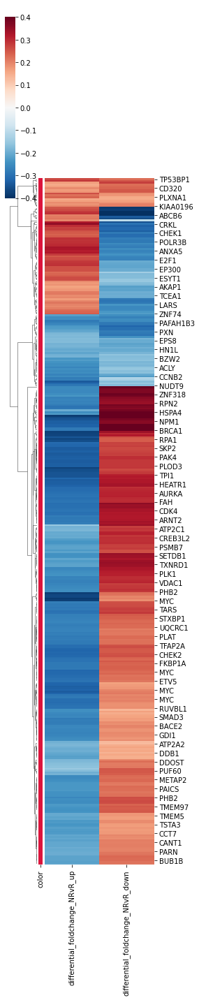

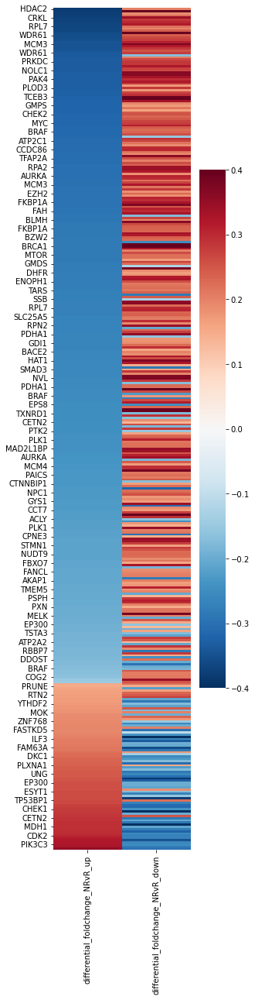

In [50]:
sns.clustermap(prerank_shRNA_91061_es_result[['differential_foldchange_NRvR_up', 'differential_foldchange_NRvR_down']].rename(index=skcm_sig_info['cmap_name']),
               figsize=(4, 20),
               cmap='RdBu_r', vmax=.4, vmin=-.4,
               col_cluster=False, row_cluster=True,
               row_colors=sig_fc_91061_color['color'])
plt.show()

plt.figure(figsize=(4, 20))
sns.heatmap(prerank_shRNA_91061_es_result[['differential_foldchange_NRvR_up', 'differential_foldchange_NRvR_down']].rename(index=skcm_sig_info['cmap_name']),
               cmap='RdBu_r', vmax=.4, vmin=-.4)
plt.show()

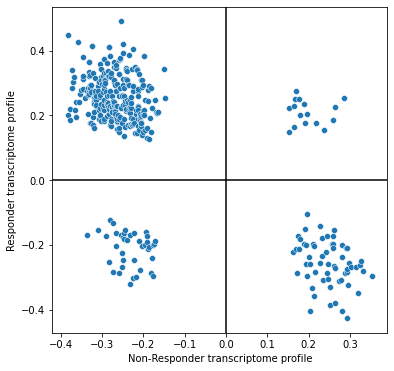

In [51]:
# visualize by scatter plot: how shRNA perturbation shift the transcriptome profiles from non-responder to responder
plt.figure(figsize=(6, 6))
sns.scatterplot(x='differential_foldchange_NRvR_up',
                y='differential_foldchange_NRvR_down',
                data=prerank_shRNA_91061_es_result)
plt.xlabel('Non-Responder transcriptome profile')
plt.ylabel('Responder transcriptome profile')
plt.axvline(x=0., c='k')
plt.axhline(y=0., c='k')

### 4.3.3 Find shRNA profiles in all perturbations that showing similar changes as the above 239 shRNAs 

#### 4.3.3.1 HCA

In [53]:
# take top shRNA perturbation candidates
shRNA_91061_hit_sig = list(prerank_shRNA_91061_es_result[(prerank_shRNA_91061_es_result['differential_foldchange_NRvR_up'] < 0) & (prerank_shRNA_91061_es_result['differential_foldchange_NRvR_down'] > 0)].index)
print(len(shRNA_91061_hit_sig))

267


C:\Users\ywang\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


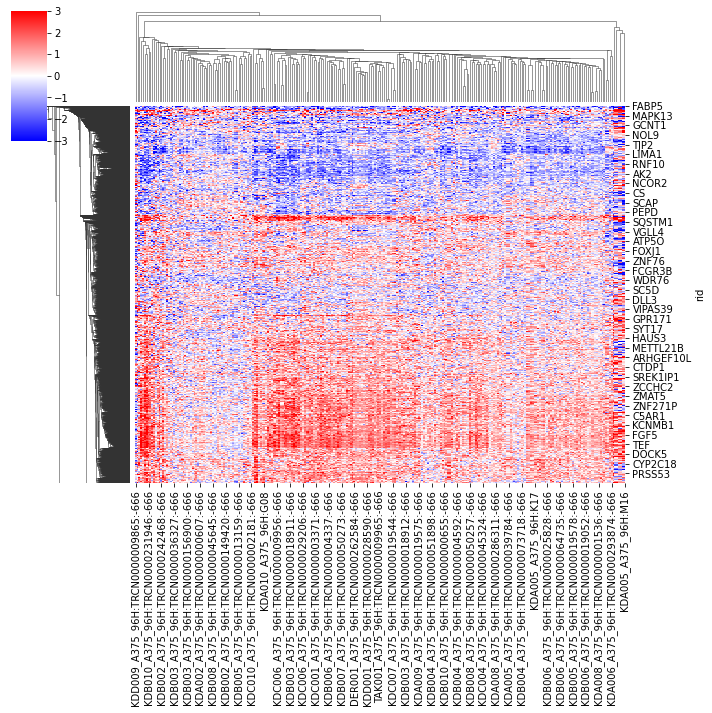

In [58]:
sns.clustermap(skcm_trt_sh_original[shRNA_91061_hit_sig], cmap='bwr', vmin=-3, vmax=3)

In [59]:
skcm_trt_sh_original.shape

(10174, 2384)

In [62]:
# calculate pairwise correlation between shRNA perturbagens in SKCM set
skcm_sh_ori_corr = skcm_trt_sh_original.corr(method='spearman')

In [63]:
skcm_sh_ori_corr.shape

(2384, 2384)

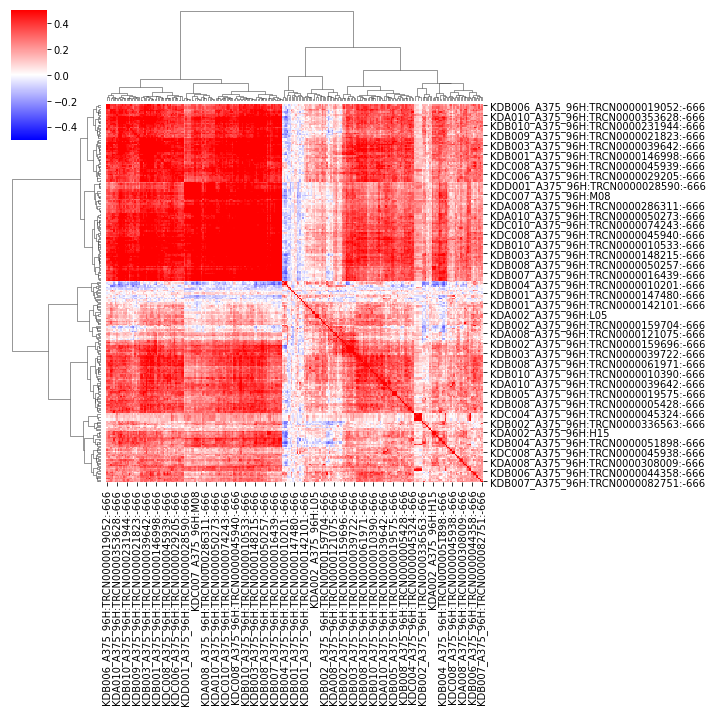

In [68]:
sns.clustermap(skcm_sh_ori_corr.loc[shRNA_91061_hit_sig, shRNA_91061_hit_sig],
               method='ward',
               cmap='bwr', vmin=-.5, vmax=.5)

In [70]:
shRNA_color = df(index=skcm_trt_sh_original.columns, columns=['top_hit', 'color'])
shRNA_color['top_hit'] = 'Unknown'
shRNA_color['color'] = 'cornflowerblue'
shRNA_color.at[shRNA_91061_hit_sig, 'top_hit'] = 'Yes'
shRNA_color.at[shRNA_91061_hit_sig, 'color'] = 'salmon'

C:\Users\ywang\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\matrix.py:654: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


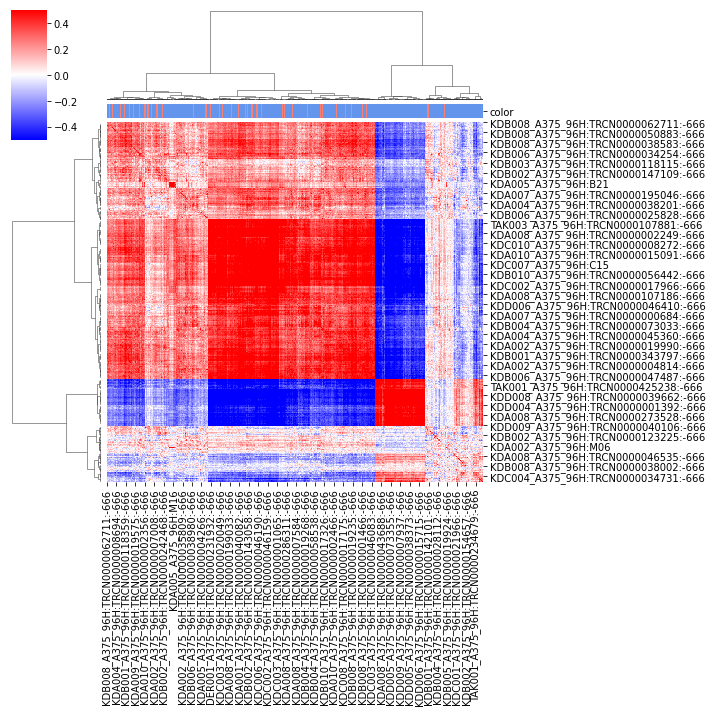

In [72]:
sns.clustermap(skcm_sh_ori_corr,
               method='ward',
               col_colors=shRNA_color['color'],
               cmap='bwr', vmin=-.5, vmax=.5)

#### 4.3.3.2 PCA

In [114]:
# run PCA
skcm_sh_pca = PCA(n_components=4, random_state=0, whiten=True).fit_transform(skcm_trt_sh_original.T)
skcm_sh_pca_coord = df(columns=['PCA-1', 'PCA-2', 'PCA-3', 'PCA-4'])
for i in range(len(skcm_trt_sh_original.columns)):
    skcm_sh_pca_coord.at[skcm_trt_sh_original.columns[i], 'PCA-1'] = skcm_sh_pca[i][0]
    skcm_sh_pca_coord.at[skcm_trt_sh_original.columns[i], 'PCA-2'] = skcm_sh_pca[i][1]
    skcm_sh_pca_coord.at[skcm_trt_sh_original.columns[i], 'PCA-3'] = skcm_sh_pca[i][2]
    skcm_sh_pca_coord.at[skcm_trt_sh_original.columns[i], 'PCA-4'] = skcm_sh_pca[i][3]
skcm_sh_pca_coord['hits'] = shRNA_color['top_hit']

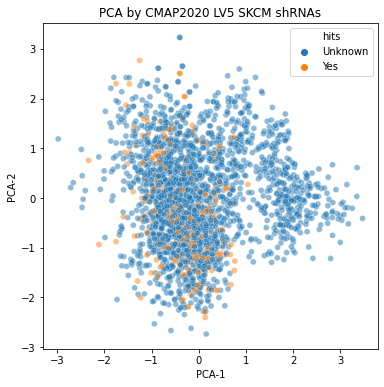

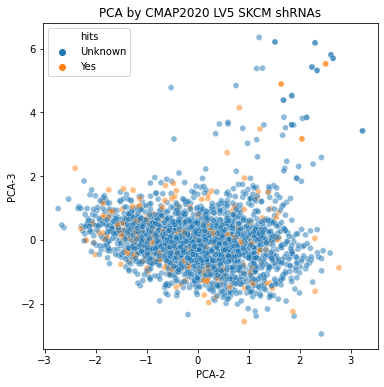

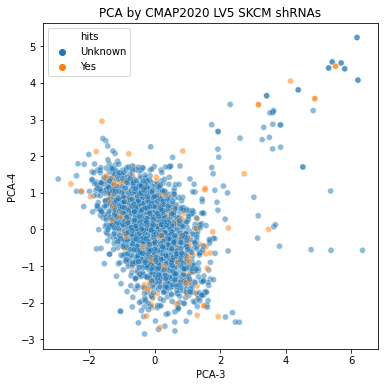

In [136]:
plt.figure(figsize=(6, 6))
sns.scatterplot(x='PCA-1',
                y='PCA-2',
                hue='hits',
                alpha=0.5,
                data=skcm_sh_pca_coord)
plt.title('PCA by CMAP2020 LV5 SKCM shRNAs')
plt.show()

plt.figure(figsize=(6, 6))
sns.scatterplot(x='PCA-2',
                y='PCA-3',
                hue='hits',
                alpha=0.5,
                data=skcm_sh_pca_coord)
plt.title('PCA by CMAP2020 LV5 SKCM shRNAs')
plt.show()

plt.figure(figsize=(6, 6))
sns.scatterplot(x='PCA-3',
                y='PCA-4',
                hue='hits',
                alpha=0.5,
                data=skcm_sh_pca_coord)
plt.title('PCA by CMAP2020 LV5 SKCM shRNAs')
plt.show()

#### 4.3.3.3 TSNE

In [133]:
# run TSNE
skcm_sh_tsne = TSNE(perplexity=40, init='random', random_state=0, learning_rate=500).fit_transform(skcm_sh_pca_coord[['PCA-1', 'PCA-2', 'PCA-3', 'PCA-4']])
skcm_sh_tsne_coord = df(columns=['TSNE-1', 'TSNE-2'])
for i in range(len(skcm_trt_sh_original.columns)):
    skcm_sh_tsne_coord.at[skcm_trt_sh_original.columns[i], 'TSNE-1'] = skcm_sh_tsne[i][0]
    skcm_sh_tsne_coord.at[skcm_trt_sh_original.columns[i], 'TSNE-2'] = skcm_sh_tsne[i][1]
skcm_sh_tsne_coord['hits'] = shRNA_color['top_hit']

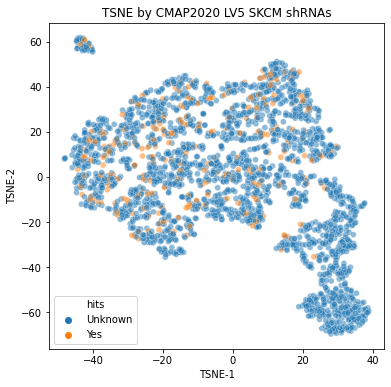

In [134]:
plt.figure(figsize=(6, 6))
sns.scatterplot(x='TSNE-1',
                y='TSNE-2',
                hue='hits',
                alpha=0.5,
                data=skcm_sh_tsne_coord)
plt.title('TSNE by CMAP2020 LV5 SKCM shRNAs')
plt.show()

### 4.3.4 K-means clustering based on pre, on, on-pre, evaluate the separation

In [99]:
kmeans_91061_cluster = df(index=paired_91061.index, columns=['response', 'response_color', 'Pre', 'On', 'FC'])
kmeans_91061_cluster['response'] = paired_91061['response']
kmeans_91061_cluster['response_color'] = paired_91061['response_color']
kmeans_91061_cluster

,response,response_color,Pre,On,FC
Pt1,PD,crimson,NaN,NaN,NaN
Pt2,SD,royalblue,NaN,NaN,NaN
Pt23,UNK,grey,NaN,NaN,NaN
Pt82,SD,royalblue,NaN,NaN,NaN
Pt49,PRCR,cornflowerblue,NaN,NaN,NaN
Pt85,PD,crimson,NaN,NaN,NaN
Pt89,SD,royalblue,NaN,NaN,NaN
Pt101,PRCR,cornflowerblue,NaN,NaN,NaN
Pt47,PD,crimson,NaN,NaN,NaN
Pt52,PD,crimson,NaN,NaN,NaN


In [104]:
# run k-means clustering on pre-treatment expression
pre_91061_expr = log2exp2_91061_top[paired_91061['Pre']]
pre_91061_kmeans = KMeans(n_clusters=2, random_state=0).fit_predict(pre_91061_expr.T)
for i in range(len(paired_91061.index)):
    kmeans_91061_cluster.at[paired_91061.index[i], 'Pre'] = pre_91061_kmeans[i]

In [105]:
# run k-means clustering on on-treatment expression
on_91061_expr = log2exp2_91061_top[paired_91061['On']]
on_91061_kmeans = KMeans(n_clusters=2, random_state=0).fit_predict(on_91061_expr.T)
for i in range(len(paired_91061.index)):
    kmeans_91061_cluster.at[paired_91061.index[i], 'On'] = on_91061_kmeans[i]

In [106]:
# run k-means clustering on on-pre (foldchange)
fc_91061_kmeans = KMeans(n_clusters=2, random_state=0).fit_predict(log2exp2_91061_top_fc.T)
for i in range(len(log2exp2_91061_top_fc.columns)):
    kmeans_91061_cluster.at[log2exp2_91061_top_fc.columns[i], 'FC'] = fc_91061_kmeans[i]

In [107]:
kmeans_91061_cluster

,response,response_color,Pre,On,FC
Pt1,PD,crimson,0,0,1
Pt2,SD,royalblue,0,0,1
Pt23,UNK,grey,0,0,1
Pt82,SD,royalblue,1,0,1
Pt49,PRCR,cornflowerblue,0,1,1
Pt85,PD,crimson,1,0,1
Pt89,SD,royalblue,0,0,1
Pt101,PRCR,cornflowerblue,0,1,1
Pt47,PD,crimson,0,0,1
Pt52,PD,crimson,0,0,1


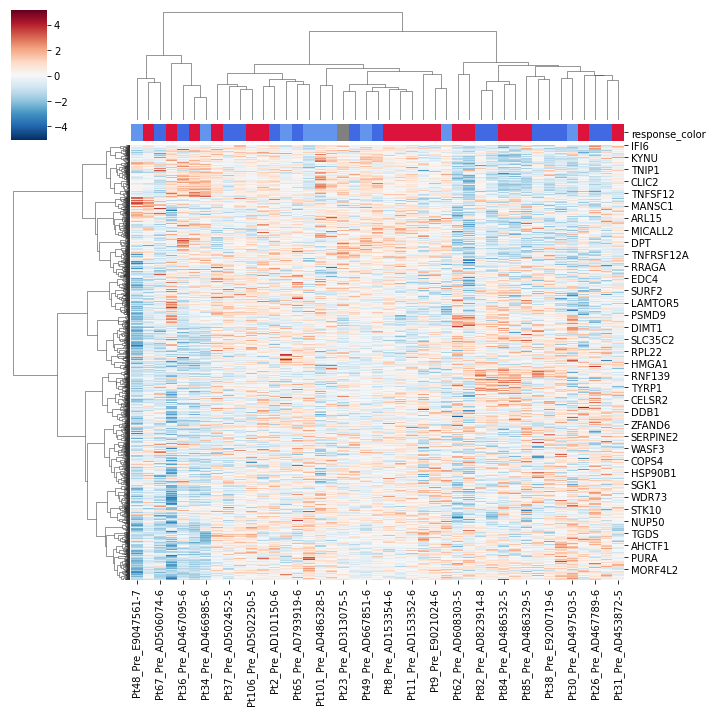

In [96]:
sns.clustermap(log2exp2_91061_top[paired_91061['Pre']],
               z_score=0,
               method='ward',
               col_colors=patient_color['response_color'],
               cmap='RdBu_r')

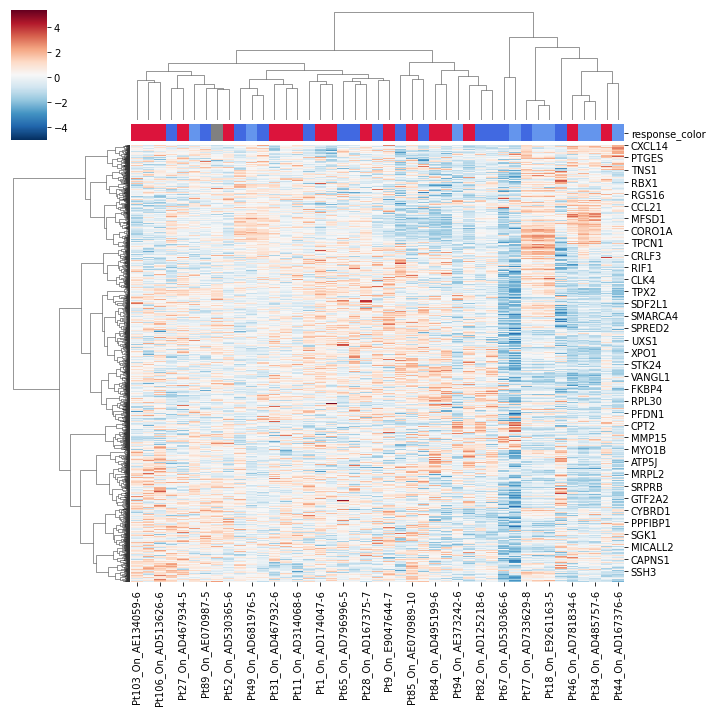

In [97]:
sns.clustermap(log2exp2_91061_top[paired_91061['On']],
               z_score=0,
               method='ward',
               col_colors=patient_color['response_color'],
               cmap='RdBu_r')

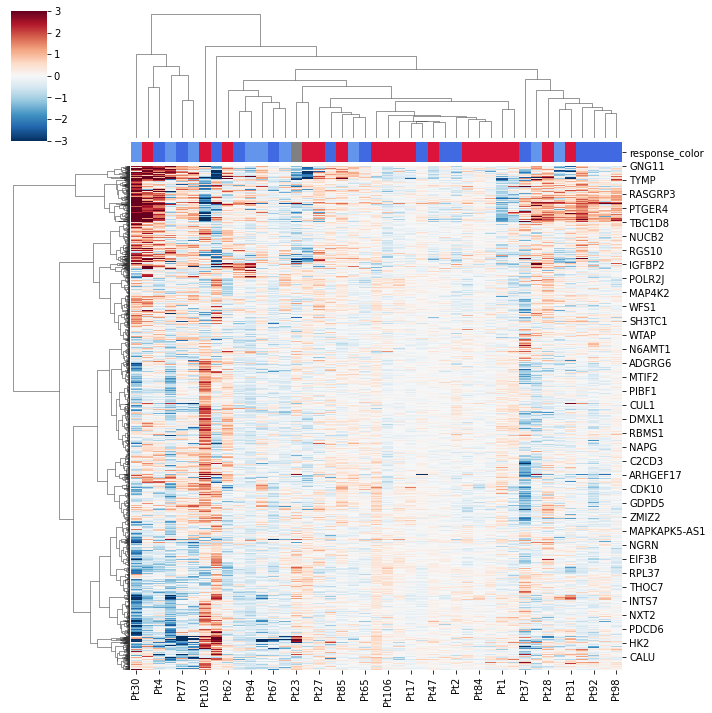

In [112]:
sns.clustermap(log2exp2_91061_top_fc,
               z_score=None,
               method='ward',
               col_colors=paired_91061['response_color'],
               cmap='RdBu_r',
               vmin=-3, vmax=3)

In [130]:
# run PCA clustering on pre-treatment expression
pre_91061_pca = PCA(n_components=2, random_state=0, whiten=True).fit_transform(pre_91061_expr.T)
pre_91061_pca_coord = df(columns=['PCA-1', 'PCA-2'])
for i in range(len(paired_91061.index)):
    pre_91061_pca_coord.at[paired_91061.index[i], 'PCA-1'] = pre_91061_pca[i][0]
    pre_91061_pca_coord.at[paired_91061.index[i], 'PCA-2'] = pre_91061_pca[i][1]
pre_91061_pca_coord['response'] = paired_91061['response']

In [131]:
# run PCA clustering on on-treatment expression
on_91061_pca = PCA(n_components=2, random_state=0, whiten=True).fit_transform(on_91061_expr.T)
on_91061_pca_coord = df(columns=['PCA-1', 'PCA-2'])
for i in range(len(paired_91061.index)):
    on_91061_pca_coord.at[paired_91061.index[i], 'PCA-1'] = on_91061_pca[i][0]
    on_91061_pca_coord.at[paired_91061.index[i], 'PCA-2'] = on_91061_pca[i][1]
on_91061_pca_coord['response'] = paired_91061['response']

In [132]:
# run PCA clustering on foldchange
fc_91061_pca = PCA(n_components=2, random_state=0, whiten=True).fit_transform(log2exp2_91061_top_fc.T)
fc_91061_pca_coord = df(columns=['PCA-1', 'PCA-2'])
for i in range(len(log2exp2_91061_top_fc.columns)):
    fc_91061_pca_coord.at[log2exp2_91061_top_fc.columns[i], 'PCA-1'] = fc_91061_pca[i][0]
    fc_91061_pca_coord.at[log2exp2_91061_top_fc.columns[i], 'PCA-2'] = fc_91061_pca[i][1]
fc_91061_pca_coord['response'] = paired_91061['response']

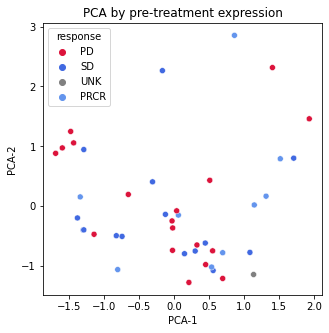

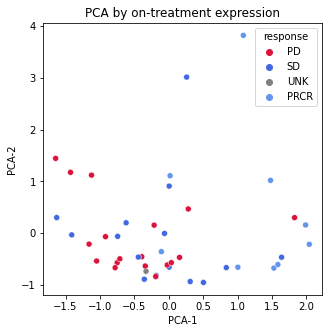

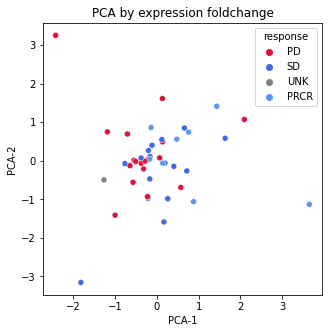

In [133]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='PCA-1',
                y='PCA-2',
                hue='response',
                palette=response_lut,
                data=pre_91061_pca_coord)
plt.title('PCA by pre-treatment expression')
plt.show()

plt.figure(figsize=(5, 5))
sns.scatterplot(x='PCA-1',
                y='PCA-2',
                hue='response',
                palette=response_lut,
                data=on_91061_pca_coord)
plt.title('PCA by on-treatment expression')
plt.show()

plt.figure(figsize=(5, 5))
sns.scatterplot(x='PCA-1',
                y='PCA-2',
                hue='response',
                palette=response_lut,
                data=fc_91061_pca_coord)
plt.title('PCA by expression foldchange')
plt.show()

In [ ]:
# evaluate the separation on first component
